<table width=100%>
<tr>
    <td><h1 style="text-align: left; font-size:300%;">
        Homework-2
    </h1></td>
    <td width="20%">
    <div style="text-align: right">
    <b> ANN2DL 2022</b> <br>
    <b> Second Homework - 09/11/2022<br>
    <b> Team: Heart of Gold<br>
    <b> Components:<br>
    Emanuele Bianchi <br>
    <a href="mailto:emanuele6.bianchi@mail.polimi.it">emanuele.bianchi@mail.polimi.it</a><br>
    Junchong Huang <br>
    <a href="mailto:junchong.huang@mail.polimi.it">junchong.huang@mail.polimi.it</a><br>
    Carlo Manenti <br>
    <a href="mailto:carlo.manenti@mail.polimi.it">carlo.manenti@mail.polimi.it</a><br>
    </div>
    </td>

</tr>
</table>

## Setting up the environment 

### IMPORTANT: THIS NOTEBOOK HAS BEEN RUN ON KAGGLE GPUS, specifically on GPU P100 accelarator. 
##### ps: the notebook take quite some time to run even with some parameters that make evreything faster. 

In [1]:
# PLEASE INSERT HERE YOU PATHS TO THE DATASET FOR BOTH X_TRAIN.NPY AND Y_TRAIN.NPY
DATASET_PATH = '/kaggle/input/training-dataset-homework2'

### importing libraries 

In [2]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px #interactive plot
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import random
import tensorflow as tf
from tensorflow.keras import layers
import keras
import keras_tuner
from sklearn.decomposition import PCA

# optional imports
import warnings
import logging

# check the tensorflow version
tfk = tf.keras
tfkl = tf.keras.layers
print(tf.__version__)

2.6.4


### Planting a seed 

In [3]:
# Planting a seed for reproducibility
seed = 42 # 'So long and thanks for all the fish' 

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

### Avoid Warnings

In [4]:
# optional: to avoid warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)
tf.get_logger().setLevel('INFO')
tf.autograph.set_verbosity(0)

tf.get_logger().setLevel(logging.ERROR)
tf.get_logger().setLevel('ERROR')
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

Now that we have set up the envioronment we can start some eplorative analysis. 

## Explorative Analysis
We want to gather as much informations as possible on our dataset. Since we know almost nothing about the context of our data. 

### Lodaing the data 

In [5]:
# define the paths 
x_train_path =  DATASET_PATH + '/x_train.npy'
y_train_path = DATASET_PATH + '/y_train.npy'

# loading the classes data
y_train = np.load(y_train_path)
x_train = np.load(x_train_path)
# to have an idea of the number of samples
y_train.shape 

(2429,)

In [6]:
# looking at the class labels 
y_train

array([ 0,  0,  0, ..., 11, 11, 11], dtype=int32)

In [7]:
# adding labels 
labels = { 
    0: "Wish You Were Here",
    1: "Another Brick In The Wall",
    2: "Comfortably Numb",
    3: "Money",
    4: "Breath",
    5: "Time",
    6: "Brain Damage",
    7: "Echoes",
    8: "Wearing The Inside Out",
    9: "Sorrow",
    10: "Hey You",
    11: "Shine On Your Crazy Diamond"}

# changing values into labels, to make them nicer 
y_train = [labels[value] for value in y_train]

# using a panda dataframe to get general informations
y_train = pd.DataFrame(y_train)
y_train.describe()

,0
count,2429
unique,12
top,Sorrow
freq,777


Sorrow is the most frequent song, with 777 samples. It makes up to almost 1/3 of the entire dataset A polite guess could be that it was done intentionally given our status of students. 

### Plotting the samples for each class 
Now we want to get an idea of the distribution of the different samples

In [8]:
# General look with an interactive plot! :)
px.histogram(y_train)

In [9]:
y_train.value_counts()

Sorrow                         777
Money                          381
Brain Damage                   313
Comfortably Numb               270
Time                           153
Another Brick In The Wall      123
Wearing The Inside Out         120
Hey You                         77
Echoes                          68
Breath                          62
Shine On Your Crazy Diamond     51
Wish You Were Here              34
dtype: int64

As expected, once again an unbalanced dataset. <br>
Now let's get a closer look at the data that we will use to train the model!

### Insepcting the features

In [10]:
x_train.shape

(2429, 36, 6)

We have 36 time points for each of the 6 features. 

In [11]:
# converting a 3D array into a MultiDimensional pandas DataFrame
# code defined thanks to stack-overflow! 

def MultiDimensionalPanda(np_array = x_train):
    np_copy = np_array.copy()
    x,y,z = np_copy.shape
    out_arr = np.column_stack((np.repeat(np.arange(x),y), np_copy.reshape(x * y, -1)))
    data = pd.DataFrame(out_arr)
    # adding the sample number to make clear were the observations for each samples starts and ends 
    data.rename(columns = {0 : 'Sample_Number'}, inplace = True)
    return data

data = MultiDimensionalPanda(x_train)
data

,Sample_Number,1,2,3,4,5,6
0,0.0,17.59700,8.17130,-1.78420,-19.70600,-9.71350,-61.8870
1,0.0,0.22974,-5.89560,16.83700,5.03900,2.43320,58.9140
2,0.0,-29.65400,-21.29600,29.10300,-0.47503,75.39100,10.6650
3,0.0,-59.21000,-29.56500,17.97100,-45.60600,19.41200,-43.0140
4,0.0,-72.06400,-25.85500,0.46536,-59.15100,-29.10500,-11.9130
...,...,...,...,...,...,...,...
87439,2428.0,3.51190,-1.03240,-1.69900,4.15790,2.75430,5.9823
87440,2428.0,0.70853,-0.94622,-1.91760,2.09480,-4.76750,7.4118
87441,2428.0,0.20638,1.02870,-0.92512,-0.71633,1.73330,4.7638
87442,2428.0,4.14290,1.09390,-0.18921,1.14100,0.93441,4.1742


In [12]:
data.describe()

,Sample_Number,1,2,3,4,5,6
count,87444.000000,87444.000000,87444.000000,87444.000000,87444.000000,87444.000000,87444.000000
mean,1214.000000,9.571373,17.942852,26.531002,32.373994,33.874759,31.481785
std,701.195852,250.301522,776.638186,699.091261,681.845382,669.444098,730.158730
min,0.000000,-3420.000000,-11585.000000,-10289.000000,-8009.900000,-7326.600000,-7584.100000
25%,607.000000,-3.574775,-1.703225,-1.704875,-2.474225,-4.052300,-8.470850
50%,1214.000000,0.275515,0.410780,0.652080,0.944095,1.286750,2.114050
75%,1821.000000,5.568825,4.117225,6.932275,9.922200,14.084250,20.723000
max,2428.000000,32932.000000,44394.000000,37032.000000,38086.000000,38490.000000,53020.000000


In [13]:
def AdditionalInformations(df_pd = data, y = y_train):
    # safety first
    y_copy = y.copy()
    
    # since we need 2 pandas dataframes to merge 
    y_pd = pd.DataFrame(y_copy)
    
    # Adding inormatios about the classes for each sample
    data = pd.merge(y_pd, df_pd, left_on = y_pd.index, right_on = 'Sample_Number')
    data.rename(columns = {0 : 'Song'}, inplace = True)

    # adding time points labels for each sample
    time_labels = [instant for instant in range(0, 36)] * len(y)
    data['time'] = time_labels
    
    unique_idx = [('song' + str(data['Song'][elem]) + '_track' + str(data['Sample_Number'][elem])) for elem in range(0, len(data['Song']))]
    data['id'] = unique_idx
    return data

In [14]:
data = AdditionalInformations(data, y_train)
data

,Song,Sample_Number,1,2,3,4,5,6,time,id
0,Wish You Were Here,0.0,17.59700,8.17130,-1.78420,-19.70600,-9.71350,-61.8870,0,songWish You Were Here_track0.0
1,Wish You Were Here,0.0,0.22974,-5.89560,16.83700,5.03900,2.43320,58.9140,1,songWish You Were Here_track0.0
2,Wish You Were Here,0.0,-29.65400,-21.29600,29.10300,-0.47503,75.39100,10.6650,2,songWish You Were Here_track0.0
3,Wish You Were Here,0.0,-59.21000,-29.56500,17.97100,-45.60600,19.41200,-43.0140,3,songWish You Were Here_track0.0
4,Wish You Were Here,0.0,-72.06400,-25.85500,0.46536,-59.15100,-29.10500,-11.9130,4,songWish You Were Here_track0.0
...,...,...,...,...,...,...,...,...,...,...
87439,Shine On Your Crazy Diamond,2428.0,3.51190,-1.03240,-1.69900,4.15790,2.75430,5.9823,31,songShine On Your Crazy Diamond_track2428.0
87440,Shine On Your Crazy Diamond,2428.0,0.70853,-0.94622,-1.91760,2.09480,-4.76750,7.4118,32,songShine On Your Crazy Diamond_track2428.0
87441,Shine On Your Crazy Diamond,2428.0,0.20638,1.02870,-0.92512,-0.71633,1.73330,4.7638,33,songShine On Your Crazy Diamond_track2428.0
87442,Shine On Your Crazy Diamond,2428.0,4.14290,1.09390,-0.18921,1.14100,0.93441,4.1742,34,songShine On Your Crazy Diamond_track2428.0


Now we have everything that we need for our simple analysis

In [15]:
def song_stats(song = 'Another Brick In The Wall', data = data, agg_type = 'mean', msg = 'of the mean values for each track'):

# pre-processing to get the data to plot
    info = data.groupby(['Song', 'time']).agg(agg_type)
    del info['Sample_Number'] # usless informations

# making the plot (a little tricky since it is interactive)
    df = pd.DataFrame() # we need a new dataframe
    for idx in range(1, 7):
        new_info = info[idx][song]
        df[idx] = new_info
    fig = px.line(df, y=df.columns[0:6], title= f'{song} : {msg}')
    fig.show()

In [16]:
song_stats()

In [17]:
song_stats('Wish You Were Here')

## Preprocessing 
First of all,  the dataset is unbalanced, so we need  a stratified split to maintain the same unbalanced composition in both train (80% of the total data) and validation(20%)

In [18]:
# re-loading the data (just to be sure)
y_train = np.load(y_train_path)
x_train = np.load(x_train_path)

# splitting the data
split_test_size = 0.2

X_train, X_validation, y_train, y_validation = train_test_split(x_train, y_train,
                                                                test_size=split_test_size,
                                                                random_state=seed,
                                                                stratify = y_train)

In [19]:
# same as before, just to make a quick check on the stratified split
y_train_ckc = [labels[value] for value in y_train]
y_train_ckc = pd.DataFrame(y_train_ckc)

# General look with an interactive plot! 
px.histogram(y_train_ckc)

The stratified split worked as intended! 

### Preprocessing: Normalising vs Standardising vs Raw Data

In [20]:
# we need to perform one hot enconding on the class labels for both train and validation
y_train, y_validation = tfk.utils.to_categorical(y_train), tfk.utils.to_categorical(y_validation)

In [21]:
# definign the paramters shared between models 
input_shape = X_train.shape[1:]
classes = y_train.shape[-1]
batch_size = 64
epochs = 500 # here we use 500 in general (50 is only to make a faster run of the notebook)

#### 1DCNN 
##### Raw Data

In [22]:
# using a simple 1DCNN as we saw from the LAB lessons

def build_1DCNN_classifier(input_shape, classes):
    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # Feature extractor
    cnn = tfkl.Conv1D(128,3,padding='same',activation='relu')(input_layer)
    cnn = tfkl.MaxPooling1D()(cnn)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='relu')(cnn)
    gap = tfkl.GlobalAveragePooling1D()(cnn)
    dropout = tfkl.Dropout(.5, seed=seed)(gap)

    # Classifier
    classifier = tfkl.Dense(128, activation='relu')(dropout)
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [23]:
# building the model
model = build_1DCNN_classifier(input_shape, classes)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 36, 6)]           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 36, 128)           2432      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 18, 128)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 18, 128)           49280     
_________________________________________________________________
global_average_pooling1d (Gl (None, 128)               0         
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               16512 

In [24]:
# handy function for plot visualisation
def PlotItEveryDay(history):
    best_epoch = np.argmax(history['val_accuracy'])
    plt.figure(figsize=(17,4))
    plt.plot(history['loss'], label='Training loss', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_loss'], label='Validation loss', alpha=.9, color='#5a9aa5')
    plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
    plt.title('Categorical Crossentropy')
    plt.legend()
    plt.grid(alpha=.3)
    plt.show()

    plt.figure(figsize=(17,4))
    plt.plot(history['accuracy'], label='Training accuracy', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.9, color='#5a9aa5')
    plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
    plt.title('Accuracy')
    plt.legend()
    plt.grid(alpha=.3)
    plt.show()

    plt.figure(figsize=(17,4))
    plt.plot(history['lr'], label='Learning Rate', alpha=.8, color='#ff7f0e')
    plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
    plt.legend()
    plt.grid(alpha=.3)
    plt.show()

In [25]:
epochs = 100 #just for now to make the full notebook run faster 
# Handy function for training and plot visualisation
def TrainingTime(model = model, X_train = X_train, y_train = y_train, X_validation = X_validation, y_validation = y_validation): 
    # by defualt it uses the raw data
    history = model.fit(
    x = X_train,
    y = y_train,
    batch_size = batch_size,
    epochs = epochs,
    validation_data=  (X_validation, y_validation),
    callbacks = [
        tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=10, restore_best_weights=True),
        tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-5)]).history
    
    PlotItEveryDay(history)

Epoch 1/100
31/31 [==============================] - 2s 12ms/step - loss: 14.4656 - accuracy: 0.1184 - val_loss: 5.1101 - val_accuracy: 0.1255
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 5.8419 - accuracy: 0.2187 - val_loss: 2.9603 - val_accuracy: 0.3477
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 3.9339 - accuracy: 0.2712 - val_loss: 2.7010 - val_accuracy: 0.3827
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 2.7391 - accuracy: 0.3742 - val_loss: 2.1935 - val_accuracy: 0.4300
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 2.5258 - accuracy: 0.3809 - val_loss: 2.0484 - val_accuracy: 0.4342
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 2.2502 - accuracy: 0.3953 - val_loss: 1.9462 - val_accuracy: 0.4321
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1263 - accuracy: 0.3973 - val_loss: 1.9381 - val_accuracy: 0.4403
Epoch 8/100

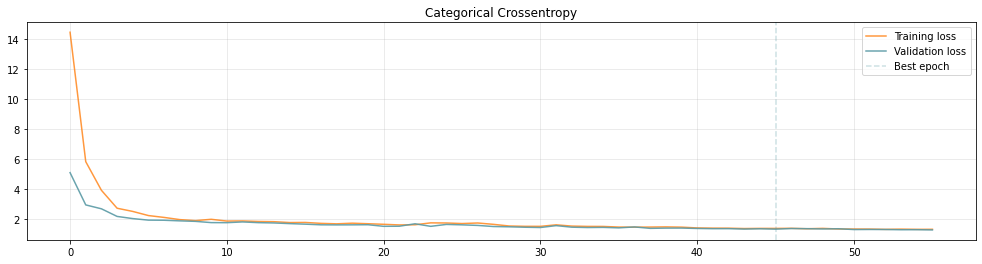

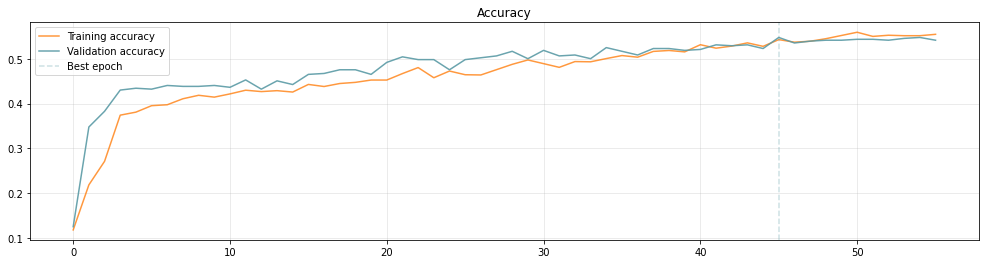

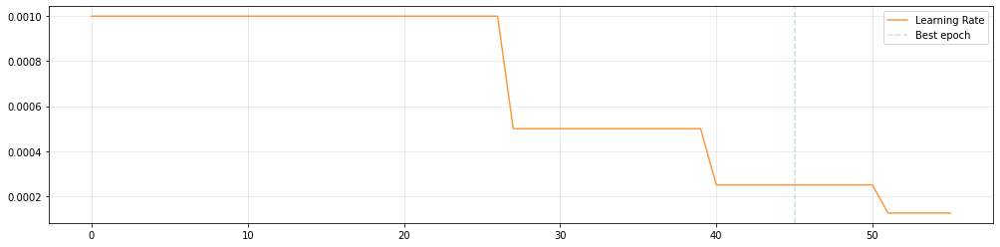

In [26]:
# this is our baseline
model = build_1DCNN_classifier(input_shape, classes)
TrainingTime(model) 

The trainign is quite nice even if the data are not preprocessed

##### Normalising the data

In [27]:
# Handy function for preprocessing the data 
def PreProcessing(scaler = MinMaxScaler(), X_train = X_train, X_validation = X_validation):
    train_original_shape = X_train.shape
    validation_original_shape = X_validation.shape

    # just to avoid re loading always evreything
    X_t, X_v = X_train.copy(), X_validation.copy()
    
    scaler = scaler.fit(X_t.reshape(-1, 1))

    # to apply the MinMaxScaler we need a 2D array so we need to apply a few reshape
    x_t_preprocessed = scaler.transform(X_t.reshape(-1, 1)).reshape(train_original_shape)

    # we need to normalise also the validation data using the parameters estimate only on the training data! 
    x_v_preprocessed = scaler.transform(X_v.reshape(-1, 1)).reshape(validation_original_shape)
    
    return x_t_preprocessed, x_v_preprocessed

In [28]:
X_train_norm, X_val_norm = PreProcessing(scaler = MinMaxScaler())

#just a quick check
px.histogram(X_train_norm.reshape(-1, 1), title = 'checking the distribution')

we are quite happy since the data have been normalised between 0 and 1

Epoch 1/100
31/31 [==============================] - 1s 9ms/step - loss: 2.2274 - accuracy: 0.3067 - val_loss: 2.0965 - val_accuracy: 0.3189
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1053 - accuracy: 0.3191 - val_loss: 2.0904 - val_accuracy: 0.3189
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1074 - accuracy: 0.3201 - val_loss: 2.0871 - val_accuracy: 0.3189
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 2.0994 - accuracy: 0.3201 - val_loss: 2.0882 - val_accuracy: 0.3189
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 2.0976 - accuracy: 0.3201 - val_loss: 2.1032 - val_accuracy: 0.3189
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1018 - accuracy: 0.3201 - val_loss: 2.0894 - val_accuracy: 0.3189
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1009 - accuracy: 0.3201 - val_loss: 2.0893 - val_accuracy: 0.3189
Epoch 8/100
3

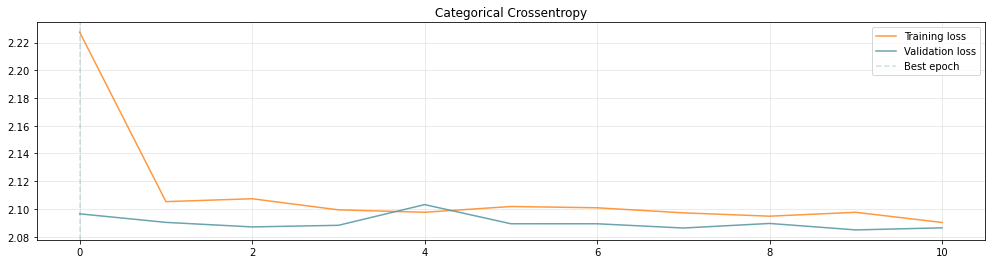

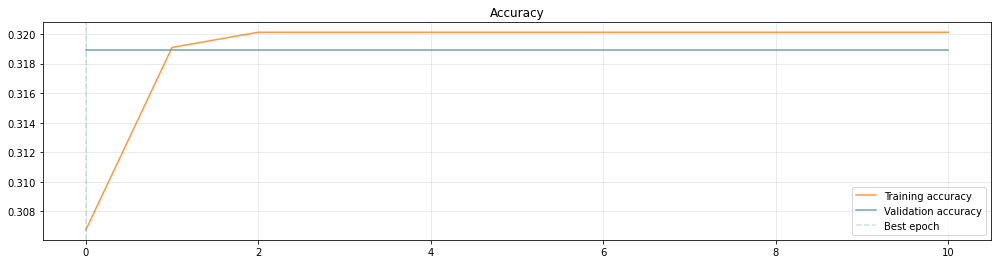

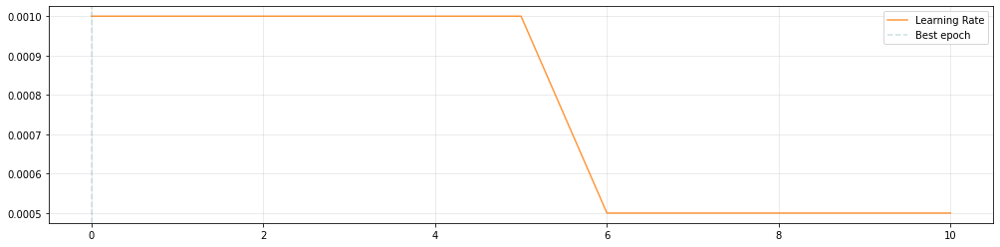

In [29]:
# same as before
model = build_1DCNN_classifier(input_shape, classes)
TrainingTime(model, X_train = X_train_norm, X_validation = X_val_norm) 

Not the results we hoped for. The validation accuracy is completly flatlined. Let's try by Standardising the data

##### Stanadardising the data
We are removing the mean and defining a unitary variance for all the samples

In [30]:
X_train_std, X_val_std = PreProcessing(scaler = StandardScaler())

#just a quick check
px.histogram(X_train_std.reshape(-1, 1), title = 'checking the distribution')

Epoch 1/100
31/31 [==============================] - 1s 9ms/step - loss: 2.3400 - accuracy: 0.3350 - val_loss: 2.1320 - val_accuracy: 0.3560
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 2.0420 - accuracy: 0.3531 - val_loss: 1.9362 - val_accuracy: 0.3621
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 1.9403 - accuracy: 0.3644 - val_loss: 1.8837 - val_accuracy: 0.3683
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8994 - accuracy: 0.3747 - val_loss: 1.8461 - val_accuracy: 0.3807
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8572 - accuracy: 0.3834 - val_loss: 1.8271 - val_accuracy: 0.3930
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8577 - accuracy: 0.3901 - val_loss: 1.7911 - val_accuracy: 0.3889
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8071 - accuracy: 0.3963 - val_loss: 1.7447 - val_accuracy: 0.3971
Epoch 8/100
3

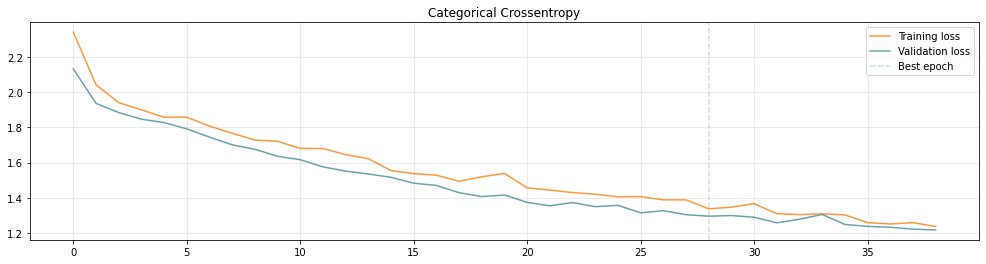

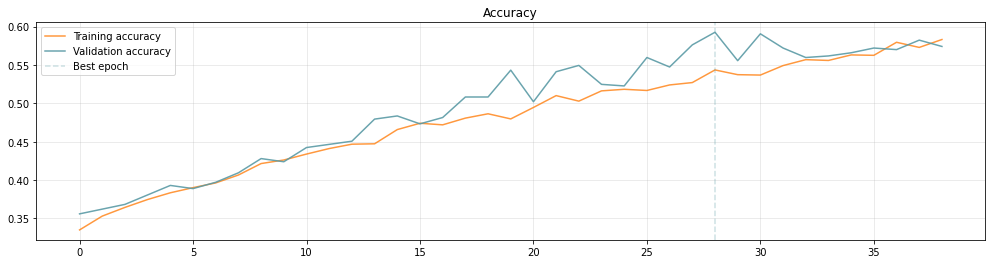

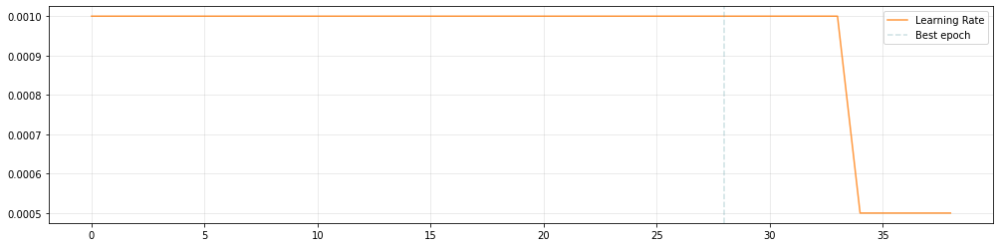

In [31]:
# same as before
model = build_1DCNN_classifier(input_shape, classes)
TrainingTime(model, X_train = X_train_std, X_validation = X_val_std) 
# Note: we could also use validation data without outliers and this would lead to a better accuracy (even better than trainign only on raw data) 
# we suspect that this could be due to a smaller validation set without any real application. Since we are modifing the training at our pleauser 
# (avoiding the challenge of outliers classification). 

The validation accuracy seemes much better than using Normalised data. But still is not on par with the Raw data. 

### Long Short Term Memory
Now we wanto also to test how preprocessing affacts the accuracy using a LSTM model

In [32]:
# building a simple LSTM taken with the balaclava from the LAB lessons
# This will be our benck mark for LSTM 

def build_LSTM_classifier(input_shape, classes):
    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # Feature extractor
    lstm = tfkl.LSTM(128, return_sequences=True)(input_layer) #return_sequences = True evrey cell returns its output. 
    # by default you return only the output of the last cell. 
    lstm = tfkl.LSTM(128)(lstm)
    dropout = tfkl.Dropout(.5, seed=seed)(lstm)

    # Classifier
    classifier = tfkl.Dense(128, activation='relu')(dropout)
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [33]:
model_LSTM = build_LSTM_classifier(input_shape, classes)
model_LSTM.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 36, 6)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 36, 128)           69120     
_________________________________________________________________
lstm_1 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dropout_4 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_9 (Dense)              (None, 12)                1548      
Total params: 218,764
Trainable params: 218,764
Non-trainable params: 0
_______________________________________________________

Epoch 1/100
31/31 [==============================] - 3s 28ms/step - loss: 1.9756 - accuracy: 0.3675 - val_loss: 1.5805 - val_accuracy: 0.4630
Epoch 2/100
31/31 [==============================] - 0s 10ms/step - loss: 1.5021 - accuracy: 0.4925 - val_loss: 1.3505 - val_accuracy: 0.5288
Epoch 3/100
31/31 [==============================] - 0s 8ms/step - loss: 1.2784 - accuracy: 0.5656 - val_loss: 1.2046 - val_accuracy: 0.5905
Epoch 4/100
31/31 [==============================] - 0s 8ms/step - loss: 1.1218 - accuracy: 0.6253 - val_loss: 1.1770 - val_accuracy: 0.5926
Epoch 5/100
31/31 [==============================] - 0s 8ms/step - loss: 1.0285 - accuracy: 0.6577 - val_loss: 1.1398 - val_accuracy: 0.5967
Epoch 6/100
31/31 [==============================] - 0s 8ms/step - loss: 0.9246 - accuracy: 0.6922 - val_loss: 1.0984 - val_accuracy: 0.6193
Epoch 7/100
31/31 [==============================] - 0s 8ms/step - loss: 0.8479 - accuracy: 0.7252 - val_loss: 1.1169 - val_accuracy: 0.6440
Epoch 8/100

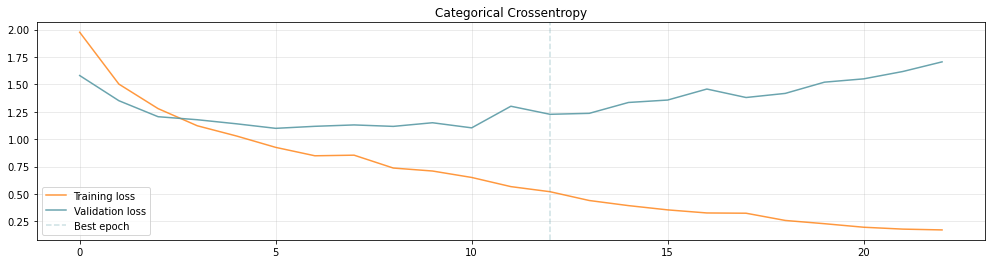

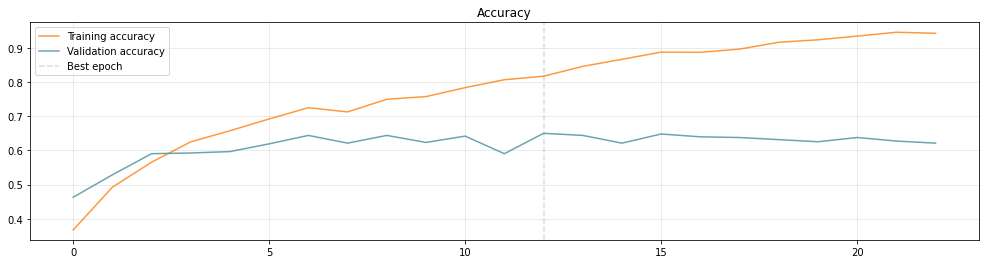

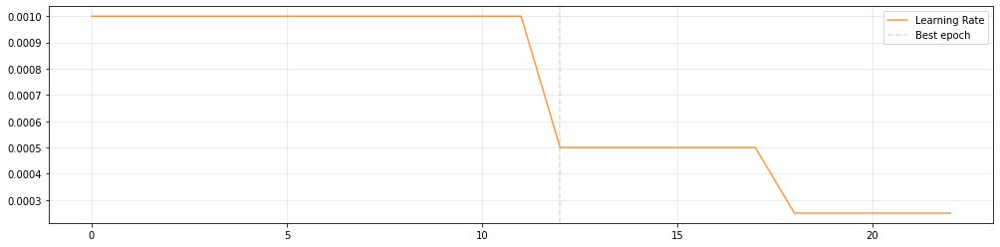

In [34]:
# this is our LSTM base line 
model_LSTM = build_LSTM_classifier(input_shape, classes)
TrainingTime(model = model_LSTM)

Epoch 1/100
31/31 [==============================] - 3s 28ms/step - loss: 2.2077 - accuracy: 0.3047 - val_loss: 2.0937 - val_accuracy: 0.3189
Epoch 2/100
31/31 [==============================] - 0s 9ms/step - loss: 2.0979 - accuracy: 0.3186 - val_loss: 2.0915 - val_accuracy: 0.3189
Epoch 3/100
31/31 [==============================] - 0s 9ms/step - loss: 2.1092 - accuracy: 0.3196 - val_loss: 2.0875 - val_accuracy: 0.3189
Epoch 4/100
31/31 [==============================] - 0s 8ms/step - loss: 2.0983 - accuracy: 0.3196 - val_loss: 2.0853 - val_accuracy: 0.3189
Epoch 5/100
31/31 [==============================] - 0s 8ms/step - loss: 2.1008 - accuracy: 0.3196 - val_loss: 2.0977 - val_accuracy: 0.3189
Epoch 6/100
31/31 [==============================] - 0s 8ms/step - loss: 2.1049 - accuracy: 0.3201 - val_loss: 2.0848 - val_accuracy: 0.3189
Epoch 7/100
31/31 [==============================] - 0s 8ms/step - loss: 2.1028 - accuracy: 0.3201 - val_loss: 2.0867 - val_accuracy: 0.3189
Epoch 8/100


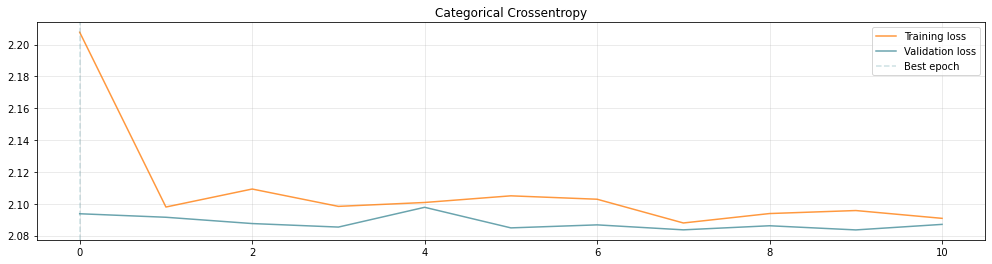

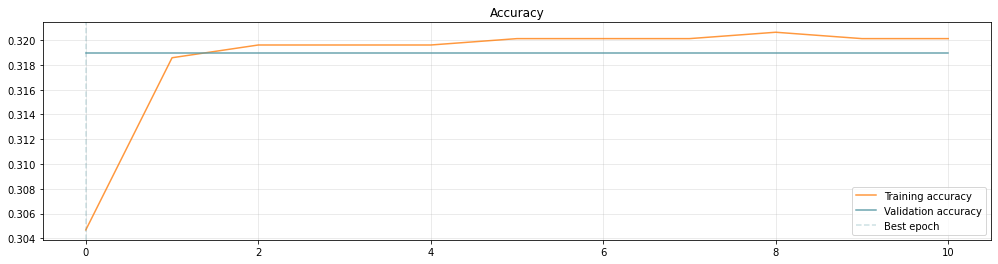

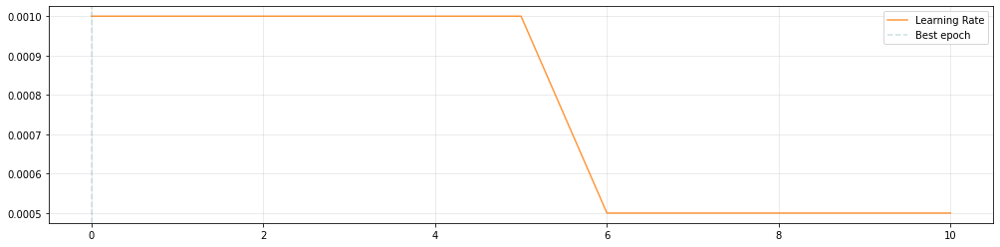

In [35]:
# With normalised data
model_LSTM = build_LSTM_classifier(input_shape, classes)
TrainingTime(model = model_LSTM, X_train = X_train_norm, X_validation = X_val_norm)

Epoch 1/100
31/31 [==============================] - 3s 27ms/step - loss: 2.2130 - accuracy: 0.3103 - val_loss: 2.0333 - val_accuracy: 0.3313
Epoch 2/100
31/31 [==============================] - 0s 8ms/step - loss: 1.9989 - accuracy: 0.3459 - val_loss: 1.9366 - val_accuracy: 0.3539
Epoch 3/100
31/31 [==============================] - 0s 8ms/step - loss: 1.9147 - accuracy: 0.3598 - val_loss: 1.8835 - val_accuracy: 0.3642
Epoch 4/100
31/31 [==============================] - 0s 8ms/step - loss: 1.8320 - accuracy: 0.3901 - val_loss: 1.7850 - val_accuracy: 0.3827
Epoch 5/100
31/31 [==============================] - 0s 9ms/step - loss: 1.7544 - accuracy: 0.4148 - val_loss: 1.9224 - val_accuracy: 0.2819
Epoch 6/100
31/31 [==============================] - 0s 10ms/step - loss: 1.7833 - accuracy: 0.3948 - val_loss: 1.7304 - val_accuracy: 0.4239
Epoch 7/100
31/31 [==============================] - 0s 10ms/step - loss: 1.7337 - accuracy: 0.4097 - val_loss: 1.7072 - val_accuracy: 0.4218
Epoch 8/10

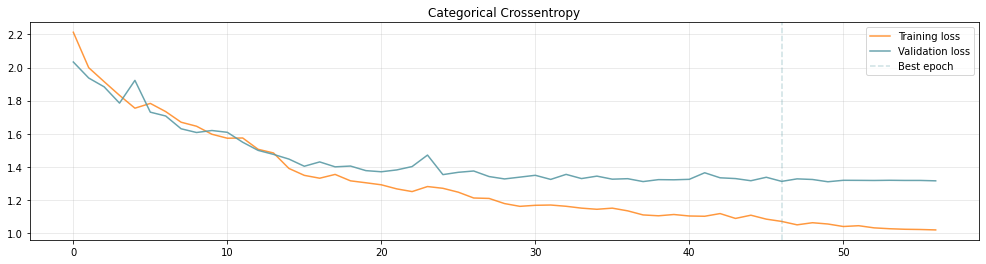

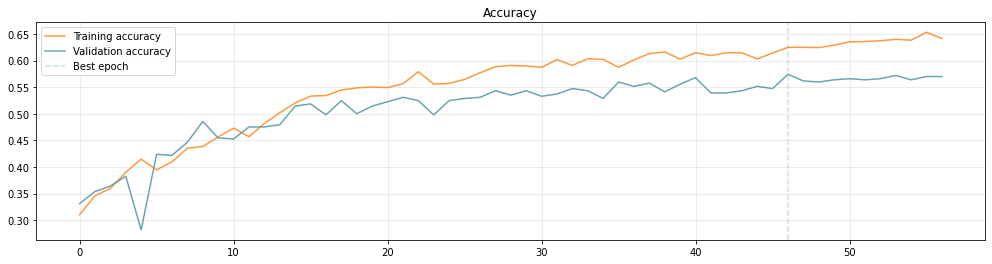

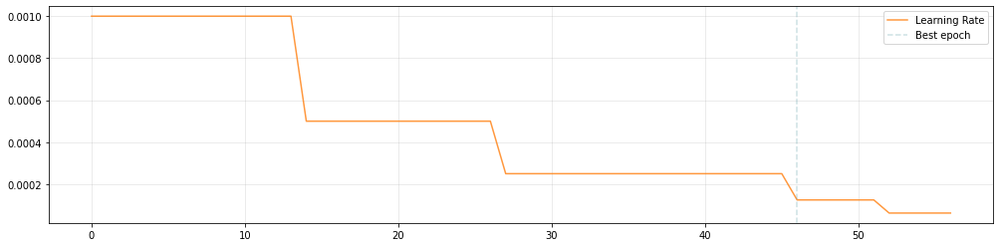

In [36]:
# with standardised data (again: we subtracted the mean and forced unitary variance using StandardScaler)
model_LSTM = build_LSTM_classifier(input_shape, classes)
TrainingTime(model = model_LSTM, X_train = X_train_std, X_validation = X_val_std)

With LSTM we can see even better the difference between Raw data (which yeild the best result), Standardised data (in the middle) and Normalised data. 

#### Outliers removal

In [37]:
def OutliersRemoval(threshold = 3, X_train = X_train, y_train = y_train, X_validation = X_validation, y_validation = y_validation):
    
    # just for safety
    X_t, y_t = X_train.copy(), y_train.copy()
    X_v, y_v = X_validation.copy(), y_validation.copy()
    
    #we need a few reshaping 
    orig_shape_train = X_t.shape
    X_t = np.reshape(X_t, (-1,X_t.shape[2]))
    
    # getting what we need
    rec_mean = np.nanmean(X_t, axis=0)
    rec_std = np.nanstd(X_t, axis=0)
    
    # re-shaping it back
    X_t = X_t.reshape(orig_shape_train)

    
    # getting things ready for the for loops
    X_t_filter = []
    y_t_filter = []
    X_val_filter = []
    y_val_filter = []

    # this is only for debugging 
    #print(X_t.shape, X_v.shape, X_t.shape[0]/X_v.shape[0])
    print('Starting the removal of outliers…')
    
    for i in range(len(X_t)):
        z_score = (X_t[i]-rec_mean)/rec_std
        if not np.any(np.abs(z_score)> threshold):
            X_t_filter.append((X_t[i]-rec_mean)/rec_std)
            y_t_filter.append(y_t[i])
    for i in range(len(X_v)):
        z_score = (X_v[i]-rec_mean)/rec_std
        if not np.any(np.abs(z_score)> threshold):
            X_val_filter.append((X_v[i]-rec_mean)/rec_std)
            y_val_filter.append(y_v[i])

    X_t_NoOutliers = np.array(X_t_filter)
    y_t_NoOutliers = np.array(y_t_filter)
    X_v_NoOutliers = np.array(X_val_filter)
    y_v_NoOutliers = np.array(y_val_filter)
    
    # this is only for debugging part 2
    #print(X_t.shape,y_t.shape)
    #print(X_t.shape, X_v.shape, X_t.shape[0]/X_v.shape[0])
    print('Done')
    return X_t_NoOutliers, y_t_NoOutliers, X_v_NoOutliers, y_v_NoOutliers

In [38]:
X_train_NoOutliers, y_train_NoOutliers, X_validation_NoOutliers, y_validation_NoOutliers = OutliersRemoval()

Starting the removal of outliers…
Done


Epoch 1/100
28/28 [==============================] - 1s 10ms/step - loss: 2.3207 - accuracy: 0.3242 - val_loss: 2.1050 - val_accuracy: 0.3377
Epoch 2/100
28/28 [==============================] - 0s 4ms/step - loss: 2.0629 - accuracy: 0.3426 - val_loss: 1.9820 - val_accuracy: 0.3399
Epoch 3/100
28/28 [==============================] - 0s 4ms/step - loss: 1.9559 - accuracy: 0.3544 - val_loss: 1.8709 - val_accuracy: 0.3904
Epoch 4/100
28/28 [==============================] - 0s 4ms/step - loss: 1.8865 - accuracy: 0.3846 - val_loss: 1.7931 - val_accuracy: 0.3904
Epoch 5/100
28/28 [==============================] - 0s 4ms/step - loss: 1.8204 - accuracy: 0.4002 - val_loss: 1.7141 - val_accuracy: 0.4101
Epoch 6/100
28/28 [==============================] - 0s 4ms/step - loss: 1.7700 - accuracy: 0.4136 - val_loss: 1.6639 - val_accuracy: 0.4605
Epoch 7/100
28/28 [==============================] - 0s 4ms/step - loss: 1.7126 - accuracy: 0.4343 - val_loss: 1.6023 - val_accuracy: 0.4386
Epoch 8/100


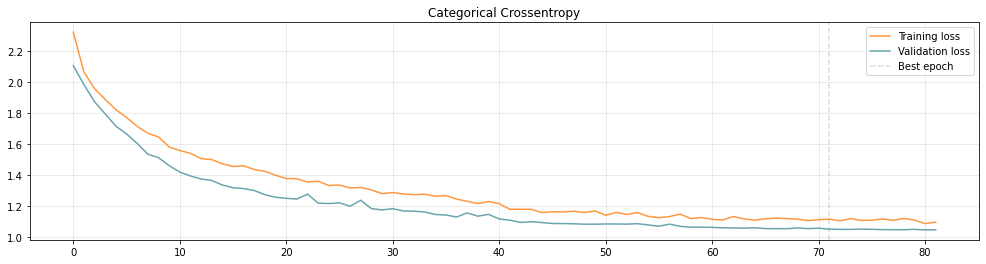

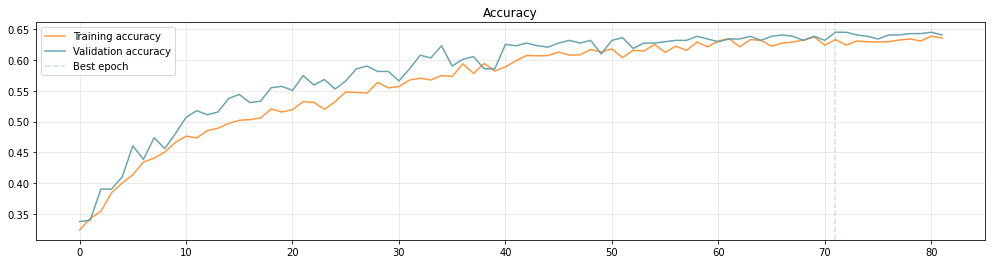

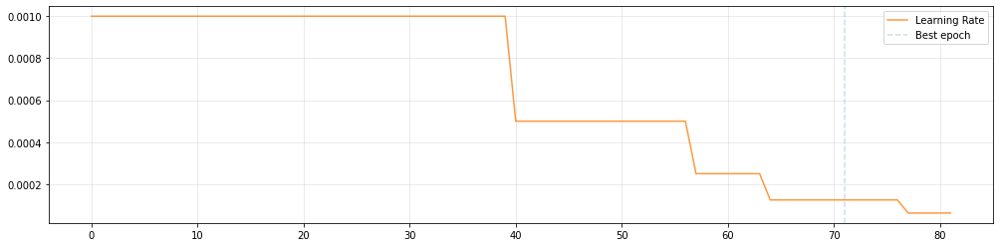

In [39]:
model = build_1DCNN_classifier(input_shape, classes)
TrainingTime(model, X_train_NoOutliers, y_train_NoOutliers, X_validation_NoOutliers, y_validation_NoOutliers) 

Also for this kind of pre-processing lead to no real improvement. Furtermore we need to remove samples, which is not a really good choiche, since we are only wasting data given that we do not have context informations about the data. So we can not know if outliers are represent reality or not. 

Furthermore the increase in validation accuracy is probably due to a smaller validation set (since we are removing samples with extreme values, which are probably the most diffuclt ones to classify). 

#### Changing the window size

In [40]:
# to get the data ready to change the window size is best to reload the data and perform another split
# this way the labels are not one-hot econded and so can be used for the build_sequence function


y_train = np.load(y_train_path)
x_train = np.load(x_train_path)

# same percentages as before
split_test_size = 0.2

X_train, X_validation, y_train, y_validation = train_test_split(x_train, y_train,
                                                                test_size=split_test_size,
                                                                random_state=seed,
                                                                stratify = y_train)

# getting the data into a pandas dataframe 
df_train, df_validation = MultiDimensionalPanda(X_train), MultiDimensionalPanda(X_validation)
df_train, df_validation = AdditionalInformations(df_train, y_train), AdditionalInformations(df_validation, y_validation)
df_train

,Song,Sample_Number,1,2,3,4,5,6,time,id
0,3,0.0,9.4335,13.17000,59.46600,99.91100,64.8050,-21.677,0,song3_track0.0
1,3,0.0,14.0650,10.77500,64.52200,124.22000,94.3040,21.010,1,song3_track0.0
2,3,0.0,15.9900,6.16210,51.47700,75.43400,105.4800,71.776,2,song3_track0.0
3,3,0.0,13.5610,2.25270,47.51600,42.06300,67.9320,78.576,3,song3_track0.0
4,3,0.0,7.3602,1.16870,47.32800,44.07800,19.3190,66.259,4,song3_track0.0
...,...,...,...,...,...,...,...,...,...,...
69943,5,1942.0,-23.2420,-0.99752,3.05810,0.61216,-11.0890,-15.050,31,song5_track1942.0
69944,5,1942.0,-11.4440,-1.09730,0.10191,-9.47300,-10.3930,108.690,32,song5_track1942.0
69945,5,1942.0,-1.3141,-1.01990,0.38957,-0.33265,9.7721,127.290,33,song5_track1942.0
69946,5,1942.0,3.6254,-0.75927,2.31480,15.33700,18.7520,26.267,34,song5_track1942.0


In [41]:
# This code was first seen during LAB lessons and reporpoused for our dataset 
# It is almost unchanged form the LAB lessons with Lomurno. 

def build_sequences(df, window= 200, stride= 200):
    assert window % stride == 0  
    
    dataset = []
    labels = []
    
    for id in df['id'].unique():
        temp = df[df['id'] == id][[1, 2, 3, 4, 5, 6]].values # This is a  simple change to repurpouse the function
        label = df[df['id'] == id]['Song'].values[0]
        
        padding_len = window - len(temp)%window 
        padding = np.zeros((padding_len, 6), dtype='float64') 
        temp = np.concatenate((temp,padding))
        
        idx = 0
        while idx+window <= len(temp):
            dataset.append(temp[idx:idx+window]) 
            labels.append(label)
            idx += stride
    dataset = np.array(dataset)
    labels = np.array(labels)
    return dataset, labels

In [42]:
window = 20 # dimension in terms of time stamps of the sub-sequences
stride = 1 

X_train_w20, y_train_w20 = build_sequences(df_train, window, stride)
X_validation_w20, y_validation_w20 = build_sequences(df_validation, window, stride)

In [43]:
# we need to re-do one hot enconding
y_train_w20, y_validation_w20 = tfk.utils.to_categorical(y_train_w20), tfk.utils.to_categorical(y_validation_w20)

Epoch 1/100
638/638 [==============================] - 3s 4ms/step - loss: 3.5910 - accuracy: 0.3519 - val_loss: 1.7816 - val_accuracy: 0.4220
Epoch 2/100
638/638 [==============================] - 2s 4ms/step - loss: 1.8102 - accuracy: 0.4231 - val_loss: 1.6305 - val_accuracy: 0.4581
Epoch 3/100
638/638 [==============================] - 2s 4ms/step - loss: 1.7388 - accuracy: 0.4409 - val_loss: 1.6564 - val_accuracy: 0.4837
Epoch 4/100
638/638 [==============================] - 2s 4ms/step - loss: 1.7468 - accuracy: 0.4463 - val_loss: 1.6372 - val_accuracy: 0.4696
Epoch 5/100
638/638 [==============================] - 3s 4ms/step - loss: 1.7379 - accuracy: 0.4492 - val_loss: 1.6265 - val_accuracy: 0.4840
Epoch 6/100
638/638 [==============================] - 3s 4ms/step - loss: 1.6664 - accuracy: 0.4632 - val_loss: 1.5919 - val_accuracy: 0.4927
Epoch 7/100
638/638 [==============================] - 2s 4ms/step - loss: 1.6165 - accuracy: 0.4764 - val_loss: 1.5248 - val_accuracy: 0.4994

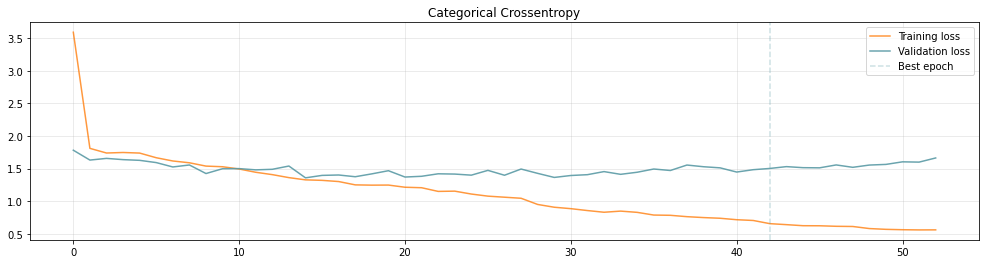

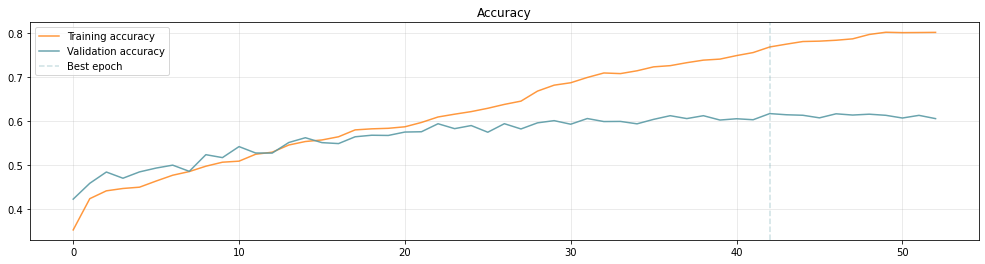

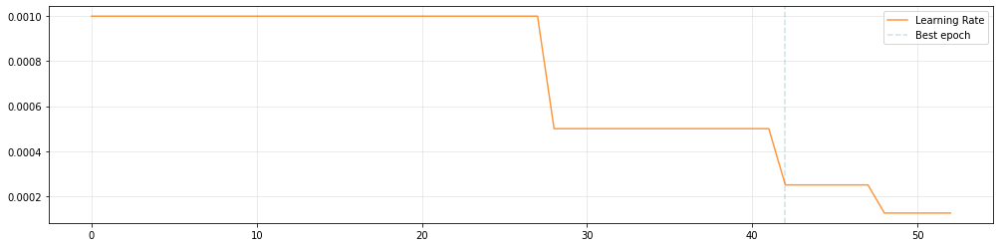

In [44]:
new_input_shape = X_train_w20.shape[1:]
# always using our all-purposes baseline the 1DCNN 
model = build_1DCNN_classifier(new_input_shape, classes)
#TrainingTime(model, X_train_w20, y_train_w20, X_validation_w20, y_validation_w20) very slow

Epoch 1/100
942/942 [==============================] - 4s 4ms/step - loss: 2.8731 - accuracy: 0.3643 - val_loss: 1.7725 - val_accuracy: 0.4217
Epoch 2/100
942/942 [==============================] - 4s 4ms/step - loss: 1.8644 - accuracy: 0.4107 - val_loss: 1.7013 - val_accuracy: 0.4530
Epoch 3/100
942/942 [==============================] - 4s 4ms/step - loss: 1.8063 - accuracy: 0.4269 - val_loss: 1.7370 - val_accuracy: 0.4525
Epoch 4/100
942/942 [==============================] - 3s 4ms/step - loss: 1.7885 - accuracy: 0.4297 - val_loss: 1.6650 - val_accuracy: 0.4550
Epoch 5/100
942/942 [==============================] - 3s 4ms/step - loss: 1.7655 - accuracy: 0.4375 - val_loss: 1.6744 - val_accuracy: 0.4622
Epoch 6/100
942/942 [==============================] - 3s 4ms/step - loss: 1.7354 - accuracy: 0.4387 - val_loss: 1.7287 - val_accuracy: 0.4450
Epoch 7/100
942/942 [==============================] - 4s 4ms/step - loss: 1.6919 - accuracy: 0.4487 - val_loss: 1.5588 - val_accuracy: 0.4744

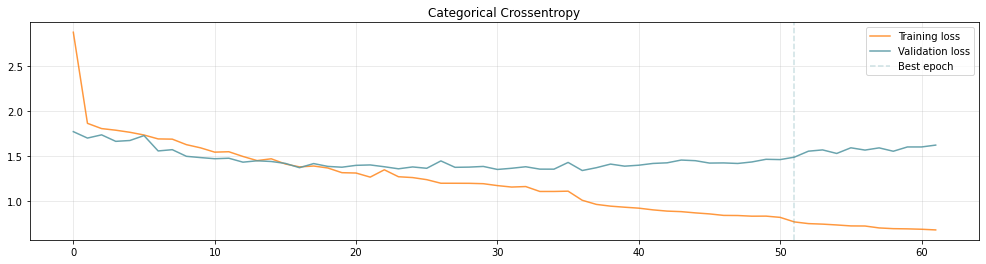

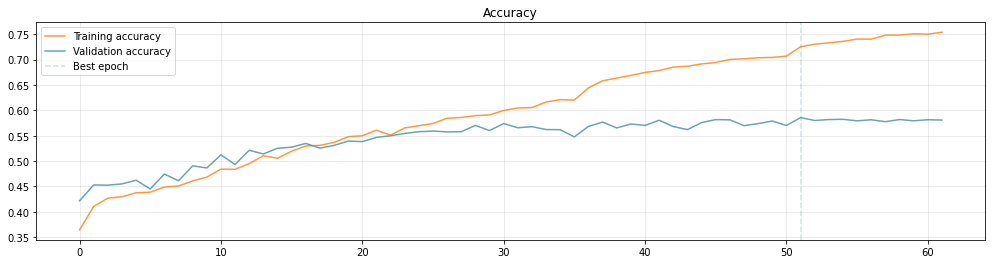

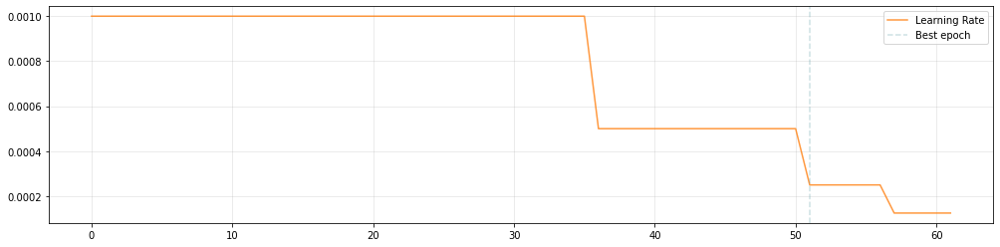

In [45]:
# we can try also for different window sizes like for 15
window = 15 

X_train_w15, y_train_w15 = build_sequences(df_train, window, stride)
X_validation_w15, y_validation_w15 = build_sequences(df_validation, window, stride)

y_train_w15, y_validation_w15 = tfk.utils.to_categorical(y_train_w15), tfk.utils.to_categorical(y_validation_w15)

new_input_shape = X_train_w15.shape[1:]

# always using our all-purposes baseline the 1DCNN 
model = build_1DCNN_classifier(new_input_shape, classes)
#TrainingTime(model, X_train_w15, y_train_w15, X_validation_w15, y_validation_w15) very slow to train

The results are sligthly worst than before. In the end we did not find any meaningful smaller window size that would have helped us in our task. So we discarded this idea. 

#### Looking for higly correlated features 

<AxesSubplot:>

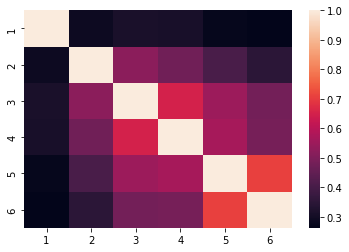

In [46]:
# looking for possible linear correlations
sns.heatmap(df_train.loc[:, 1 : 6].corr()) 

we can notice how feature 5 and 6 are the most correlated. But also feature 4 and 5 are to some extent correlated. We could try remove one of them and see how the model behaves

In [47]:
# fucntion to remove one feature from a pandas dataframe 
def Nfreefeature(freefeature = 5, df = df_train):
# Giuditta (my girlfriend) prefers the number 6 ('è pari'), so feature 5 gets to die
    
    df = df.copy() # hard copy just in case
    num_samples = int(len(df) / 36)
    time_points = 36
    
    # removing unneeded columns
    del df['Song']
    del df['Sample_Number']
    del df['time']
    del df['id']
    
    if freefeature != 0:
        
        del df[freefeature]
        
        X = df.to_numpy().reshape(num_samples, time_points, 5) 
    elif freefeature == 0:
        
        X = df.to_numpy().reshape(num_samples, time_points, 6) # baseline case
    
    features_selected = df.columns  # this will be useful later :) 
    return df, X, features_selected

In [48]:
# for train (it uses by default the train dataframe)
df_train_5free, X_train_5free, fs_train = Nfreefeature(5)

# same for validation
df_validation_5free, X_validation_5free, fs_validation = Nfreefeature(5, df_validation)

# quick check
df_train_5free

,1,2,3,4,6
0,9.4335,13.17000,59.46600,99.91100,-21.677
1,14.0650,10.77500,64.52200,124.22000,21.010
2,15.9900,6.16210,51.47700,75.43400,71.776
3,13.5610,2.25270,47.51600,42.06300,78.576
4,7.3602,1.16870,47.32800,44.07800,66.259
...,...,...,...,...,...
69943,-23.2420,-0.99752,3.05810,0.61216,-15.050
69944,-11.4440,-1.09730,0.10191,-9.47300,108.690
69945,-1.3141,-1.01990,0.38957,-0.33265,127.290
69946,3.6254,-0.75927,2.31480,15.33700,26.267


In [49]:
X_train_5free.shape

(1943, 36, 5)

Now we could also try to test all the possible combinations of 5 features plus the baseline with all the 6 features to see if there is a clear best combinations of features

In [50]:
def FirstStepForwardSelection(build = build_1DCNN_classifier, epochs = 20):
    models = []
    accs = []
    best_acc = []

    num_features = 6
    epochs = 20

    y_t, y_v = y_train.copy(), y_validation.copy()
    y_t, y_v = tfk.utils.to_categorical(y_t), tfk.utils.to_categorical(y_v)

    for i in range(0, (num_features + 1)): #enumerating the features
        # getting the data without a given feature
        df_t, X_t, fs_t = Nfreefeature(freefeature = i, df = df_train)
        df_v, X_v, fs_v = Nfreefeature(freefeature = i, df = df_validation)

        # building a model with i feature removed 
        # in this case is quite simple since the input shape is always the same
        Toy = build(input_shape = X_t.shape[1:], classes = 12)


        # we need history defined to then get the max accuracy of each model and so select 
        # the best model. For this reason we can not apply TrainingTime here (at least)
        # we can not at least we decide to change it.
        
        print(f'HISTORY MODEL:{fs_t}')
        history = Toy.fit(
        x = X_t,
        y = y_t,
        batch_size = batch_size,
        epochs = epochs,
        validation_data= (X_v, y_v),
        callbacks = [
            tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=5, restore_best_weights=True),
            tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-5)
        ]).history
        
        PlotItEveryDay(history)
        print('\n\n')

        models.append(fs_t) # storing the combination of features used
        accs.append(max(history['val_accuracy'])) # storing the max accuracy reached on the validation set

    best_acc = [acc_i == max(accs) for acc_i in accs]
    best_model = [model for best_acc, model in zip(best_acc, models) if best_acc]
    print('\n')
    print('BEST FEATURES FOR THE MODEL')
    return best_model

HISTORY MODEL:Index([1, 2, 3, 4, 5, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 17.2619 - accuracy: 0.0926 - val_loss: 3.5856 - val_accuracy: 0.2160
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 7.3598 - accuracy: 0.1580 - val_loss: 2.8308 - val_accuracy: 0.2119
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 4.1623 - accuracy: 0.2723 - val_loss: 2.3450 - val_accuracy: 0.4074
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 2.7964 - accuracy: 0.3587 - val_loss: 2.3270 - val_accuracy: 0.3765
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 2.5905 - accuracy: 0.3572 - val_loss: 2.0204 - val_accuracy: 0.4506
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.3459 - accuracy: 0.3917 - val_loss: 2.0441 - val_accuracy: 0.4547
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.1499 - accuracy: 0.4102 - val

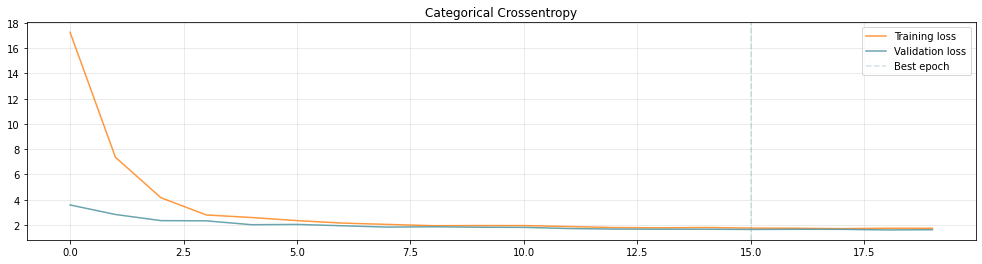

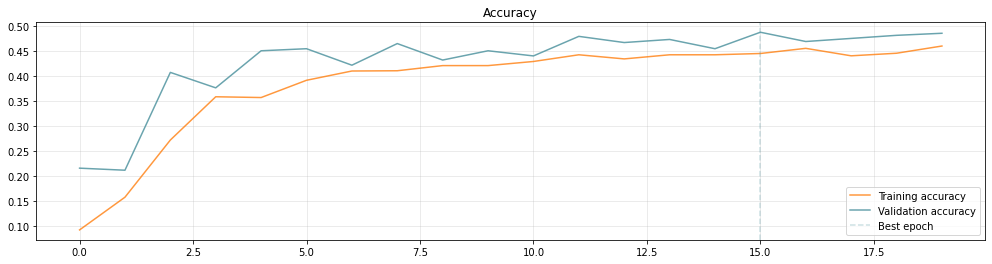

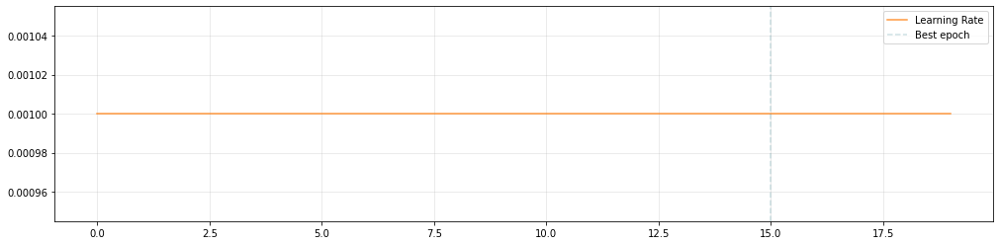




HISTORY MODEL:Index([2, 3, 4, 5, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 10ms/step - loss: 18.1821 - accuracy: 0.0968 - val_loss: 3.9795 - val_accuracy: 0.3354
Epoch 2/20
31/31 [==============================] - 0s 5ms/step - loss: 7.1532 - accuracy: 0.1719 - val_loss: 2.9079 - val_accuracy: 0.2675
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 4.3818 - accuracy: 0.2295 - val_loss: 2.6924 - val_accuracy: 0.2881
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 3.0881 - accuracy: 0.3037 - val_loss: 2.6709 - val_accuracy: 0.3333
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 3.2211 - accuracy: 0.3598 - val_loss: 2.5081 - val_accuracy: 0.3724
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.3632 - accuracy: 0.3922 - val_loss: 2.1443 - val_accuracy: 0.4095
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.2519 - accuracy: 0.3937 - va

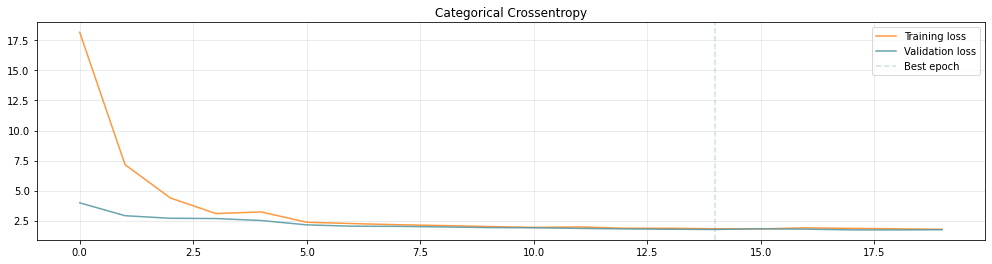

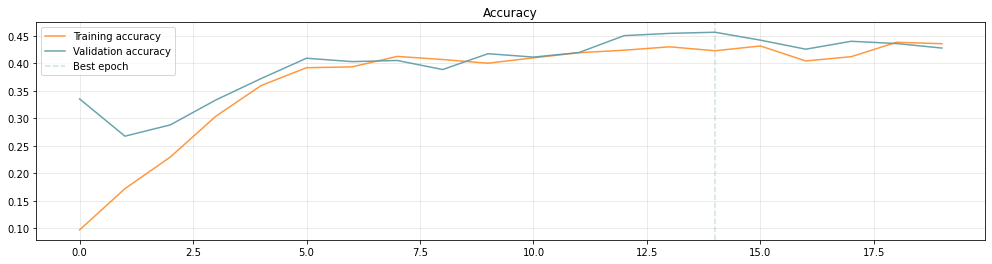

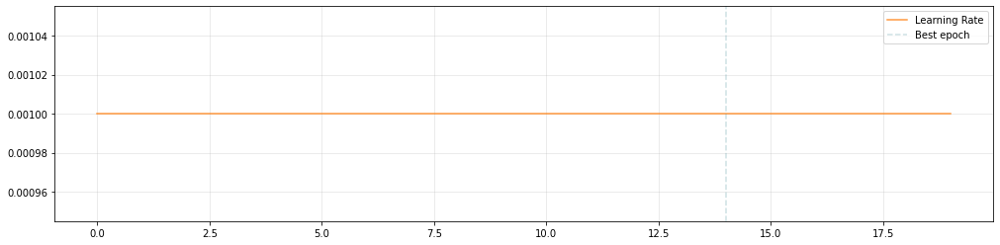




HISTORY MODEL:Index([1, 3, 4, 5, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 17.5285 - accuracy: 0.0803 - val_loss: 4.6647 - val_accuracy: 0.0988
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 6.8771 - accuracy: 0.1534 - val_loss: 3.1830 - val_accuracy: 0.1831
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 4.4858 - accuracy: 0.2697 - val_loss: 2.8180 - val_accuracy: 0.3148
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 3.6829 - accuracy: 0.2666 - val_loss: 2.4074 - val_accuracy: 0.3025
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 2.6568 - accuracy: 0.3402 - val_loss: 2.0747 - val_accuracy: 0.4259
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.3474 - accuracy: 0.3948 - val_loss: 2.0714 - val_accuracy: 0.4300
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.1945 - accuracy: 0.4056 - val

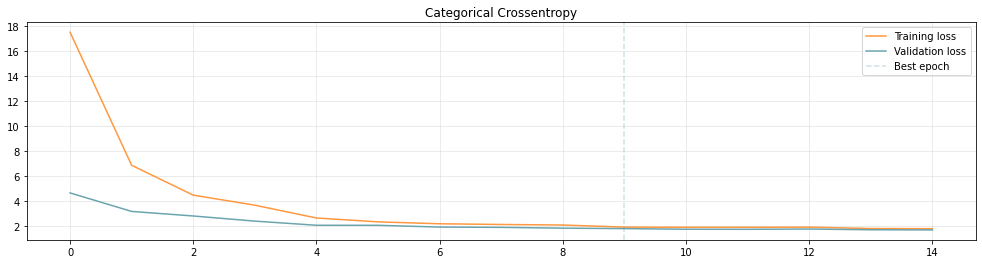

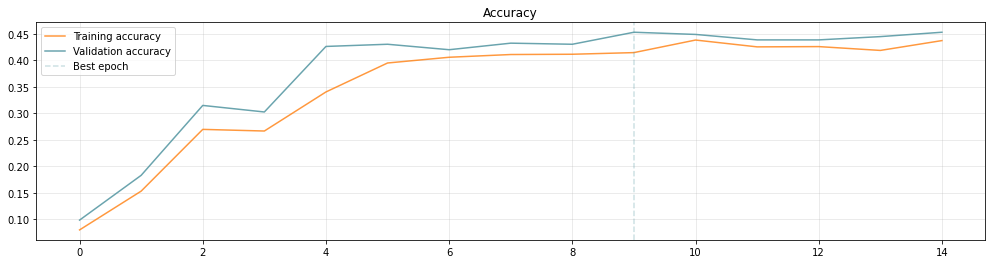

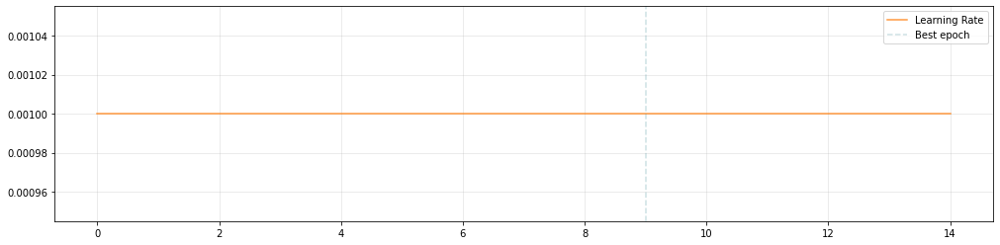




HISTORY MODEL:Index([1, 2, 4, 5, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 12.5848 - accuracy: 0.0885 - val_loss: 5.4839 - val_accuracy: 0.1996
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 5.9661 - accuracy: 0.1765 - val_loss: 2.9825 - val_accuracy: 0.3663
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 3.9497 - accuracy: 0.3062 - val_loss: 2.1636 - val_accuracy: 0.4280
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 3.0914 - accuracy: 0.3510 - val_loss: 2.4744 - val_accuracy: 0.4012
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 2.7510 - accuracy: 0.3412 - val_loss: 2.1160 - val_accuracy: 0.4053
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.6794 - accuracy: 0.3798 - val_loss: 1.9663 - val_accuracy: 0.4156
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.2651 - accuracy: 0.3963 - val

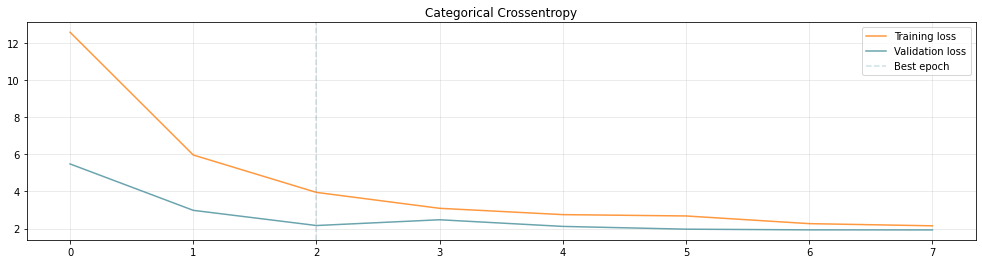

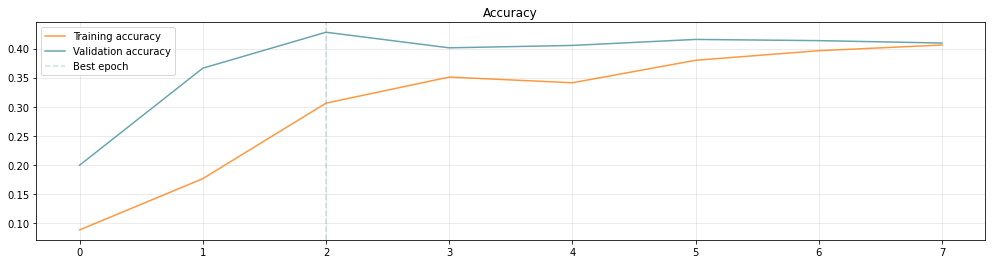

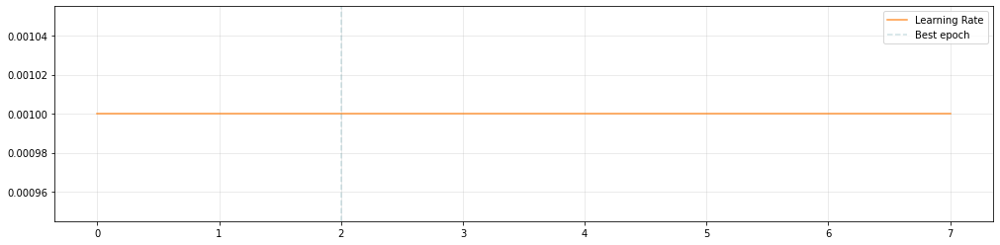




HISTORY MODEL:Index([1, 2, 3, 5, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 8ms/step - loss: 17.2887 - accuracy: 0.1220 - val_loss: 6.8366 - val_accuracy: 0.0617
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 7.6647 - accuracy: 0.1889 - val_loss: 3.3297 - val_accuracy: 0.3025
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 5.2753 - accuracy: 0.2460 - val_loss: 2.5747 - val_accuracy: 0.3457
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 3.1835 - accuracy: 0.3320 - val_loss: 2.0766 - val_accuracy: 0.4733
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 2.7714 - accuracy: 0.3603 - val_loss: 2.0323 - val_accuracy: 0.4444
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.3775 - accuracy: 0.4086 - val_loss: 2.0882 - val_accuracy: 0.4383
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.2379 - accuracy: 0.4153 - val

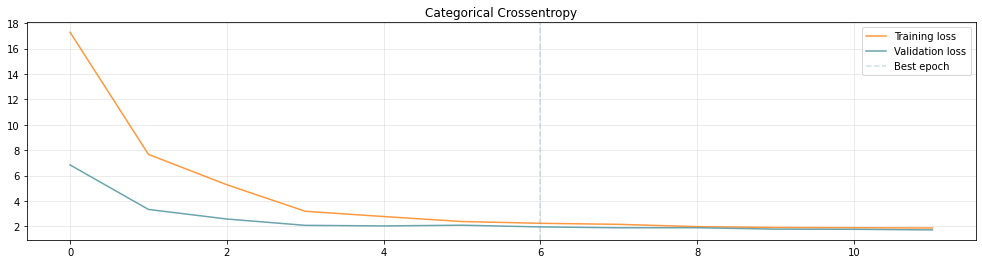

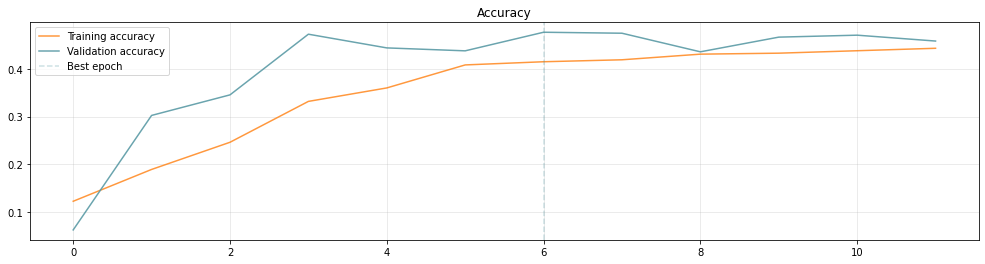

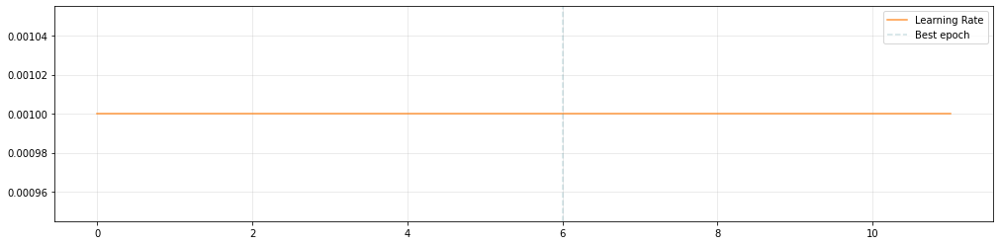




HISTORY MODEL:Index([1, 2, 3, 4, 6], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 19.2731 - accuracy: 0.1029 - val_loss: 6.5248 - val_accuracy: 0.0473
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 7.8763 - accuracy: 0.1740 - val_loss: 4.4313 - val_accuracy: 0.0967
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 5.4904 - accuracy: 0.1740 - val_loss: 2.8058 - val_accuracy: 0.2654
Epoch 4/20
31/31 [==============================] - 0s 6ms/step - loss: 3.3482 - accuracy: 0.2990 - val_loss: 2.3118 - val_accuracy: 0.4239
Epoch 5/20
31/31 [==============================] - 0s 9ms/step - loss: 2.7738 - accuracy: 0.3690 - val_loss: 2.2762 - val_accuracy: 0.4095
Epoch 6/20
31/31 [==============================] - 0s 9ms/step - loss: 2.2827 - accuracy: 0.4025 - val_loss: 2.0216 - val_accuracy: 0.4527
Epoch 7/20
31/31 [==============================] - 0s 9ms/step - loss: 2.2704 - accuracy: 0.4128 - val

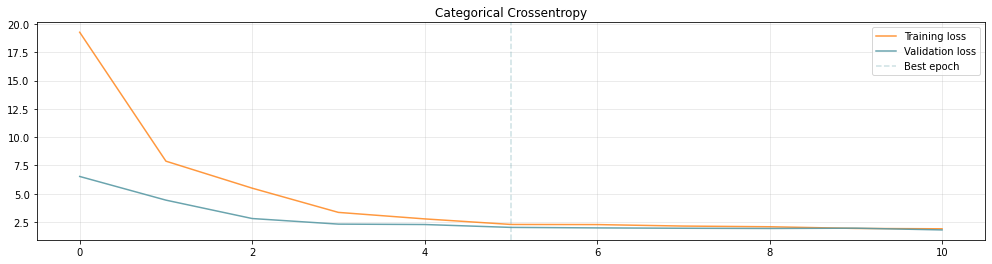

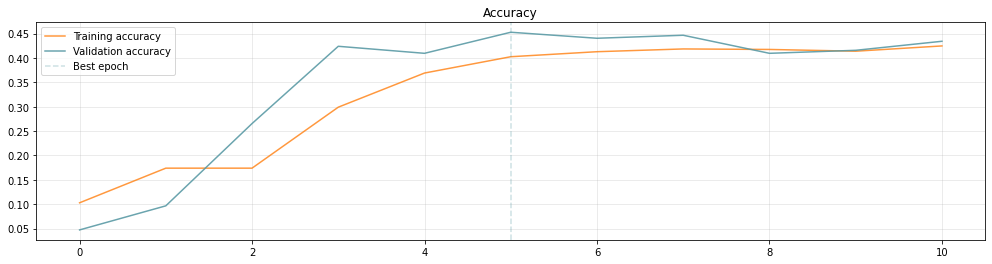

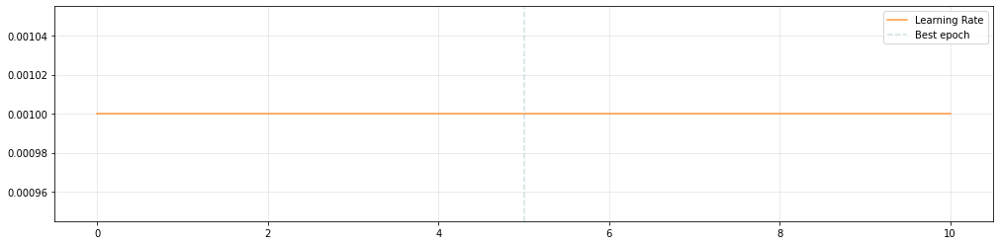




HISTORY MODEL:Index([1, 2, 3, 4, 5], dtype='object')
Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 18.5657 - accuracy: 0.0880 - val_loss: 6.5737 - val_accuracy: 0.1070
Epoch 2/20
31/31 [==============================] - 0s 4ms/step - loss: 5.6090 - accuracy: 0.1796 - val_loss: 3.0586 - val_accuracy: 0.2449
Epoch 3/20
31/31 [==============================] - 0s 4ms/step - loss: 4.1236 - accuracy: 0.2604 - val_loss: 2.3195 - val_accuracy: 0.4527
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 2.8715 - accuracy: 0.3525 - val_loss: 2.0901 - val_accuracy: 0.4342
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 2.4775 - accuracy: 0.3736 - val_loss: 1.9943 - val_accuracy: 0.4424
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 2.3244 - accuracy: 0.4056 - val_loss: 1.9228 - val_accuracy: 0.4609
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 2.0747 - accuracy: 0.4308 - val

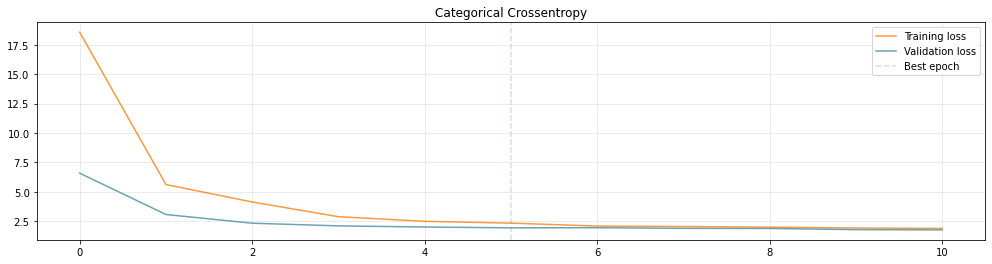

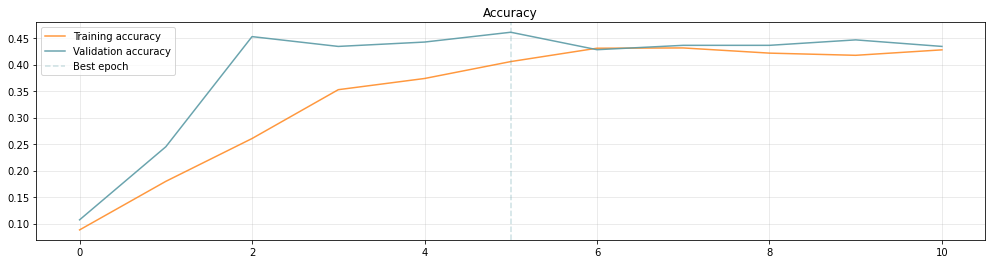

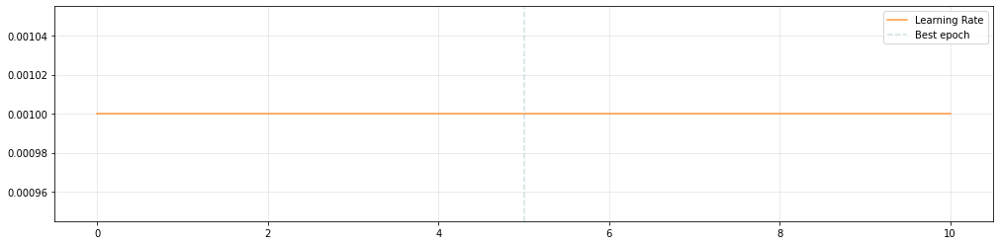






BEST FEATURES FOR THE MODEL


[Index([1, 2, 3, 4, 5, 6], dtype='object')]

In [51]:
FirstStepForwardSelection()
# we defined a function so that we may try this approach with other models 

Running multiple times this approach we can notice how unrelaiable it is! So we decided to avoid removing features. 


A better approach would have been to use K-fold Cross Validation but given to a lack of time for the challenge we were not able to implement it. Also for this kind of dataset (df_train and df_validation) performing K-fold Cross Validation would lead to a complitly random shuffle of the time points of each sample. (We implemented K-fold CV up to this point and then we decided to stop given the time constraints). Given more time it could be a good idea to implement Step wise Forward Feature selection using also K-fold CV to make the selection robust and so relayable. 

#### PCA time

In [52]:
def PCA_reduction(X = X_train, scaler = StandardScaler(), n_components = 2):
    num_samples, repetitions, num_features = X.shape

    X = X.reshape(-1, 1)
    model = scaler.fit(X)
    scaled_data = model.transform(X)
    X_st = scaled_data.reshape(-1).reshape(num_samples, repetitions, num_features)

    m,n,r = X_st.shape
    out_arr = np.column_stack((np.repeat(np.arange(num_samples), repetitions), X_st.reshape(num_samples * repetitions,-1)))
    data_st = pd.DataFrame(out_arr)
    data_st.rename(columns = {0:'Sample_Number'}, inplace = True)

    pca2 = PCA(n_components= n_components)
    principalComponents = pca2.fit_transform(data_st.loc[:, 1: num_features])
    principalComponents.shape
    X_pc = principalComponents.reshape(-1).reshape(num_samples, repetitions, n_components) 
    return X_pc

In [53]:
X_train_pc, X_validation_pc = PCA_reduction(n_components = 6) , PCA_reduction(X = X_validation, n_components = 6)

Epoch 1/100
31/31 [==============================] - 1s 8ms/step - loss: 2.3414 - accuracy: 0.3335 - val_loss: 2.1049 - val_accuracy: 0.3395
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 2.0216 - accuracy: 0.3541 - val_loss: 1.9327 - val_accuracy: 0.3642
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 1.9422 - accuracy: 0.3716 - val_loss: 1.8956 - val_accuracy: 0.3765
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8959 - accuracy: 0.3736 - val_loss: 1.8991 - val_accuracy: 0.3807
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8607 - accuracy: 0.3891 - val_loss: 2.0256 - val_accuracy: 0.3621
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8625 - accuracy: 0.3875 - val_loss: 1.8298 - val_accuracy: 0.3909
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8153 - accuracy: 0.3927 - val_loss: 1.9144 - val_accuracy: 0.3416
Epoch 8/100
3

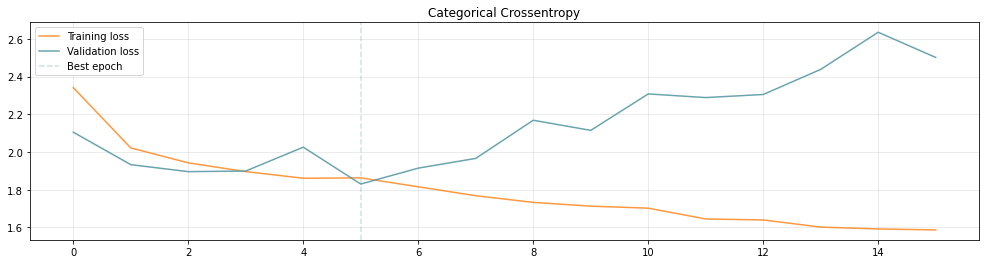

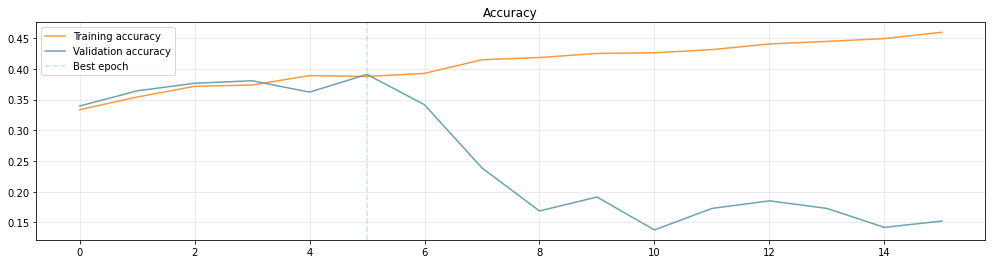

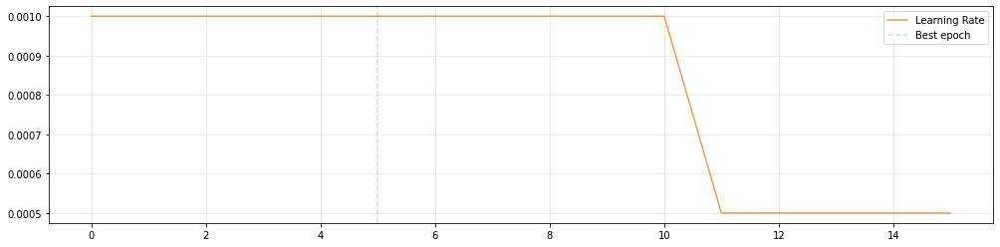

In [54]:
TrainingTime(X_train = X_train_pc, X_validation = X_validation_pc)

Epoch 1/100
31/31 [==============================] - 1s 11ms/step - loss: 2.3553 - accuracy: 0.3258 - val_loss: 2.1415 - val_accuracy: 0.3436
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 2.0591 - accuracy: 0.3500 - val_loss: 1.9505 - val_accuracy: 0.3560
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 1.9526 - accuracy: 0.3577 - val_loss: 1.9053 - val_accuracy: 0.3807
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 1.9002 - accuracy: 0.3747 - val_loss: 1.9087 - val_accuracy: 0.3889
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8707 - accuracy: 0.3824 - val_loss: 2.0594 - val_accuracy: 0.1996
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8688 - accuracy: 0.3860 - val_loss: 1.8870 - val_accuracy: 0.4074
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 1.8275 - accuracy: 0.3937 - val_loss: 1.9659 - val_accuracy: 0.2284
Epoch 8/100


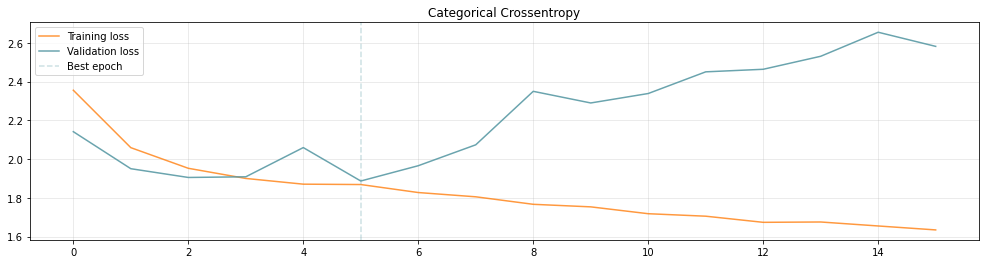

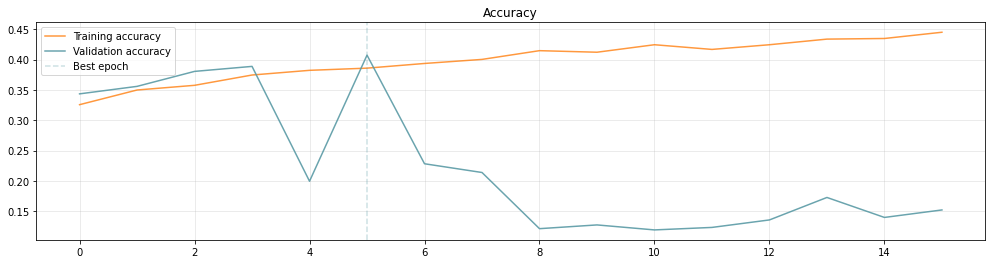

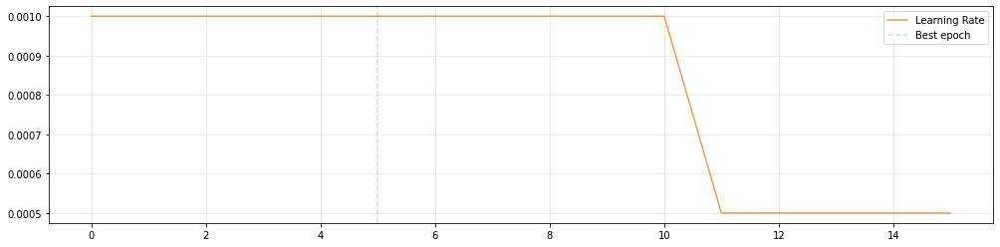

In [55]:
X_train_pc, X_validation_pc = PCA_reduction(), PCA_reduction(X = X_validation)

# we need to set the input shape to 36, 2 since we are using only 2 features, which are the 2 best principal components
model = build_1DCNN_classifier(input_shape = X_train_pc.shape[1:], classes = classes)

TrainingTime(model = model, X_train = X_train_pc, X_validation = X_validation_pc)

For our simple test we can see how PCA reduction is a very poor approach to the taks. Furthermore using 6 principal components seems a better choice than using only 2.

### BiLSTM 
We also tried BiLSTM just to get an idea of its capabilities with this task

In [56]:
def build_BiLSTM_classifier(input_shape, classes):
    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # Feature extractor
    bilstm = tfkl.Bidirectional(tfkl.LSTM(128, return_sequences=True))(input_layer)
    bilstm = tfkl.Bidirectional(tfkl.LSTM(128))(bilstm)
    dropout = tfkl.Dropout(.5, seed=seed)(bilstm)

    # Classifier
    classifier = tfkl.Dense(128, activation='relu')(dropout)
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [57]:
model = build_BiLSTM_classifier(input_shape, classes)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 36, 6)]           0         
_________________________________________________________________
bidirectional (Bidirectional (None, 36, 256)           138240    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               394240    
_________________________________________________________________
dropout_19 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_38 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_39 (Dense)             (None, 12)                1548      
Total params: 566,924
Trainable params: 566,924
Non-trainable params: 0
_______________________________________________________

Epoch 1/100
31/31 [==============================] - 6s 67ms/step - loss: 1.9025 - accuracy: 0.3824 - val_loss: 1.4390 - val_accuracy: 0.4650
Epoch 2/100
31/31 [==============================] - 0s 15ms/step - loss: 1.3467 - accuracy: 0.5270 - val_loss: 1.2373 - val_accuracy: 0.5473
Epoch 3/100
31/31 [==============================] - 0s 15ms/step - loss: 1.1177 - accuracy: 0.6171 - val_loss: 1.1244 - val_accuracy: 0.5967
Epoch 4/100
31/31 [==============================] - 0s 14ms/step - loss: 0.9418 - accuracy: 0.6732 - val_loss: 1.1383 - val_accuracy: 0.6029
Epoch 5/100
31/31 [==============================] - 0s 14ms/step - loss: 0.8774 - accuracy: 0.6969 - val_loss: 1.0782 - val_accuracy: 0.6173
Epoch 6/100
31/31 [==============================] - 0s 14ms/step - loss: 0.7466 - accuracy: 0.7483 - val_loss: 1.0697 - val_accuracy: 0.6276
Epoch 7/100
31/31 [==============================] - 0s 14ms/step - loss: 0.6226 - accuracy: 0.7880 - val_loss: 1.1636 - val_accuracy: 0.6276
Epoch 

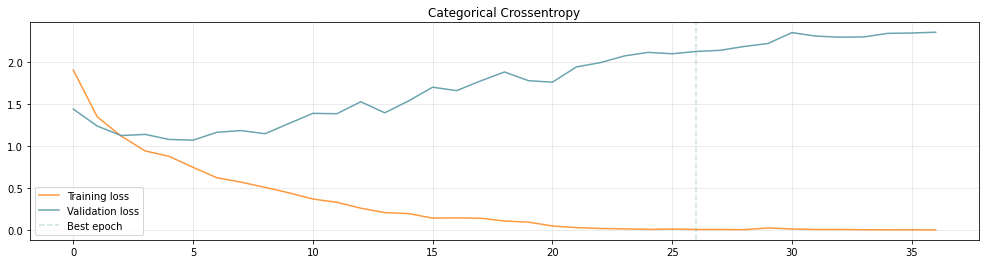

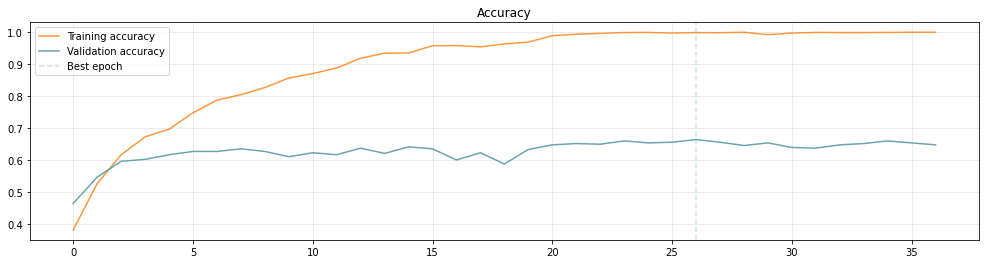

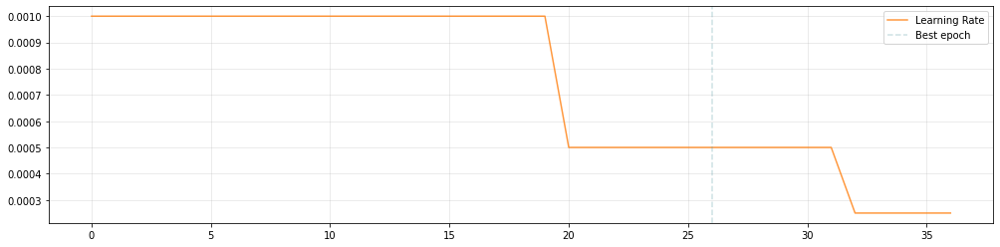

In [58]:
model = build_BiLSTM_classifier(input_shape, classes)
TrainingTime(model)

### Fully Tunable Model 
Now we can use KerasTuner to search the best parameters for the 1D CNN model!

In [64]:
y_train = np.load(y_train_path)
x_train = np.load(x_train_path)

# same percentages as before
split_test_size = 0.2

X_train, X_validation, y_train, y_validation = train_test_split(x_train, y_train,
                                                                test_size=split_test_size,
                                                                random_state=seed,
                                                                stratify = y_train)
input_shape = X_train.shape[1:]

y_train, y_validation = tfk.utils.to_categorical(y_train), tfk.utils.to_categorical(y_validation)

In [65]:
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape = input_shape))
    # adding tunable number of units for Conv1D layers
    model.add(layers.Conv1D(filters=hp.Int("units", min_value= 32, max_value=512, step= 32), kernel_size = 3, padding='same', activation="relu"))
    model.add(layers.MaxPooling1D())
    # same here
    model.add(layers.Conv1D(filters=hp.Int("units", min_value= 32, max_value=512, step= 32), kernel_size = 3, padding='same', activation="relu"))
    model.add(layers.GlobalAveragePooling1D())
    model.add(layers.Dropout(.5, seed = seed))
    # we have done the same for the Dense layer
    model.add(layers.Dense(units=hp.Int("units", min_value= 32, max_value=512, step=32), activation="relu"))
    model.add(layers.Dense(classes, activation='softmax'))
    
    model.compile( optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
    return model

In [66]:
model = build_model(keras_tuner.HyperParameters())
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_2 (Conv1D)            (None, 36, 32)            608       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 18, 32)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 18, 32)            3104      
_________________________________________________________________
global_average_pooling1d_1 ( (None, 32)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_3 (Dense)              (None, 12)               

In [67]:
max_trials = 2 #just to run faster the notebook

# define the tuner! 
tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_accuracy",
    max_trials= max_trials,
    executions_per_trial=5,
    overwrite=True,
    directory="my_dir",
    project_name="Toy_Search",)

tuner.search_space_summary()

Search space summary
Default search space size: 1
units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}


In [68]:
# Let's tune 
tuner.search(X_train, y_train, epochs = 2, validation_data = (X_validation, y_validation))

Trial 2 Complete [00h 00m 08s]
val_accuracy: 0.29094650149345397

Best val_accuracy So Far: 0.3111111164093018
Total elapsed time: 00h 00m 18s


Epoch 1/100
31/31 [==============================] - 1s 10ms/step - loss: 4.3989 - accuracy: 0.3011 - val_loss: 2.3287 - val_accuracy: 0.4486
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 3.0477 - accuracy: 0.3289 - val_loss: 2.3219 - val_accuracy: 0.3951
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 2.7755 - accuracy: 0.3603 - val_loss: 2.0932 - val_accuracy: 0.4115
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 2.3909 - accuracy: 0.3690 - val_loss: 2.2498 - val_accuracy: 0.3704
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 2.4617 - accuracy: 0.3798 - val_loss: 1.9692 - val_accuracy: 0.4156
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 2.2682 - accuracy: 0.3937 - val_loss: 2.0476 - val_accuracy: 0.3971
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 2.1229 - accuracy: 0.3917 - val_loss: 1.9134 - val_accuracy: 0.4053
Epoch 8/100


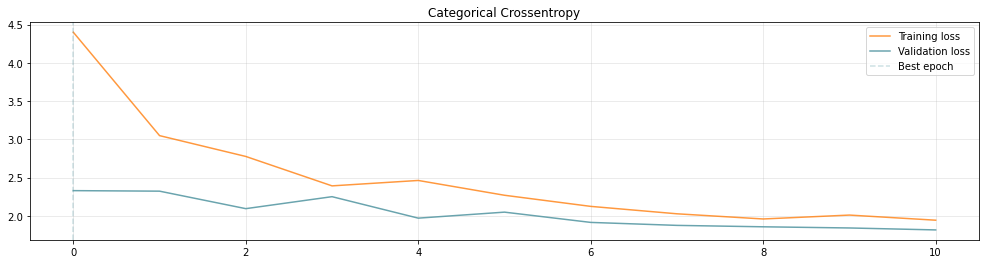

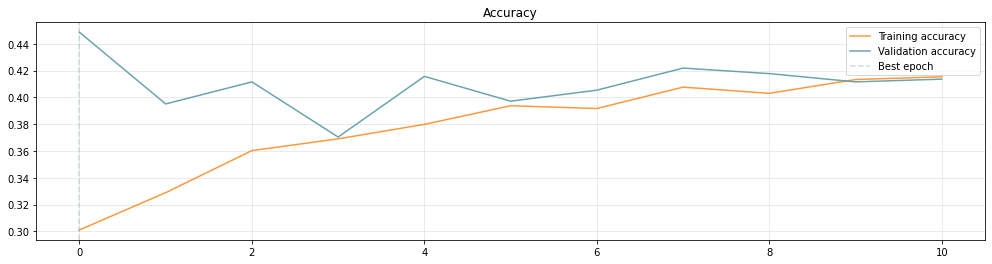

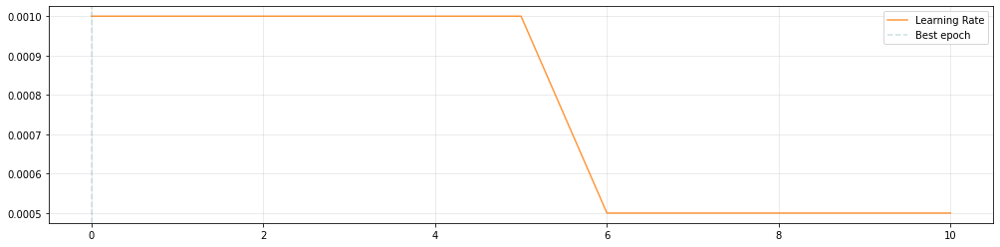

In [69]:
# Query the search
models = tuner.get_best_models(num_models=1)
best_model = models[0]

best_model.build()
TrainingTime(best_model)

Tuning the model seems to lead to overall better results!

Now we will try to go fully tunable! Hoping for even better results

In [70]:
def build_FullyTunableModel(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape = input_shape))
    
    # adding tunable number of Conv1D with specific number of neruones for each
    if hp.Boolean("Conv1D_1"):
        model.add(layers.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))) 
        
        # we are also tuning the MaxPoolingLayer and adding it if it is useful
        model.add(layers.MaxPooling1D())

    if hp.Boolean("Conv1d_2"):
        model.add(layers.Conv1D(filters = hp.Int('filters_2', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))) 
        
        # we are also tuning the MaxPoolingLayer and adding it if it is useful
        model.add(layers.MaxPooling1D())
    
    if hp.Boolean("Conv1d_3"):
        model.add(layers.Conv1D(filters = hp.Int('filters_3', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))) 
        
        # we are also tuning the MaxPoolingLayer and adding it if it is useful
        model.add(layers.MaxPooling1D())
        
    if hp.Boolean("Conv1d_3"):
        model.add(layers.Conv1D(filters = hp.Int('filters_4', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))) 
        
        # we are also tuning the MaxPoolingLayer and adding it if it is useful
        model.add(layers.MaxPooling1D()) 
    
    if hp.Boolean("Conv1d_3"):
        model.add(layers.Conv1D(filters = hp.Int('filters_5', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))) 
        
        # we are also tuning the MaxPoolingLayer and adding it if it is useful
        model.add(layers.MaxPooling1D())

          
    # same here
    model.add(layers.Conv1D(filters=hp.Int("filters_6", min_value= 32, max_value=512, step= 32), 
                            kernel_size = 3,
                            padding = 'same', 
                            activation= hp.Choice("activation", ["relu", 'elu'])))
              
    model.add(layers.GlobalAveragePooling1D())
    
    if hp.Boolean("dropout"):
            model.add(layers.Dropout(rate= hp.Float("rate_1", min_value= 0.1, max_value=0.3, step=0.02)))
            
    # now we have a varing number of Dense layers, each will be optimised differently for the number of neurons
    for i in range(hp.Int("num_layers", 1, 10)):
        model.add(layers.Dense(units= hp.Int(f"units{i}" , min_value=16, max_value=512, step=16), 
                               activation= hp.Choice("activation", ["relu", 'elu']))) 
        
        # we are also tuning the dropout layer and adding it if it is useful
        if hp.Boolean(f"dropout{i}"):
            model.add(layers.Dropout(rate= hp.Float(f"rate{i}", min_value= 0.1, max_value= 0.3, step=0.02)))
              
    model.add(layers.Dense(classes, activation='softmax'))
    
    learning_rate = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")
    model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
    return model

In [71]:
FullyTunableModel = build_FullyTunableModel(keras_tuner.HyperParameters())

In [72]:
# now we can perform more trails and keep a decent number of executions to avoid too much variability in the results. 
# Of course this will come at a price in terms of time.

tuner = keras_tuner.RandomSearch(
    hypermodel=build_FullyTunableModel,
    objective="val_accuracy",
    max_trials= max_trials, #here we generally use 20
    executions_per_trial=3,
    overwrite=True,
    directory="my_dir",
    project_name="FullyTunable_Search",
)

tuner.search_space_summary()

Search space summary
Default search space size: 10
Conv1D_1 (Boolean)
{'default': False, 'conditions': []}
Conv1d_2 (Boolean)
{'default': False, 'conditions': []}
Conv1d_3 (Boolean)
{'default': False, 'conditions': []}
filters_6 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'elu'], 'ordered': False}
dropout (Boolean)
{'default': False, 'conditions': []}
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 1, 'sampling': None}
units0 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 512, 'step': 16, 'sampling': None}
dropout0 (Boolean)
{'default': False, 'conditions': []}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}


In [73]:
tuner.search(X_train, y_train, epochs = 5, validation_data = (X_validation, y_validation))

Trial 2 Complete [00h 00m 08s]
val_accuracy: 0.5802469253540039

Best val_accuracy So Far: 0.5802469253540039
Total elapsed time: 00h 00m 19s


In [74]:
#tuner.results_summary() #to get the datils of the results provided by the tuning step

Epoch 1/100
31/31 [==============================] - 1s 8ms/step - loss: 1.7756 - accuracy: 0.5486 - val_loss: 1.6853 - val_accuracy: 0.6091
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 1.5225 - accuracy: 0.5610 - val_loss: 1.5787 - val_accuracy: 0.6111
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 1.4396 - accuracy: 0.5718 - val_loss: 1.5063 - val_accuracy: 0.6111
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 1.4493 - accuracy: 0.5718 - val_loss: 1.4568 - val_accuracy: 0.5905
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 1.6025 - accuracy: 0.5713 - val_loss: 1.3329 - val_accuracy: 0.6173
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 1.3842 - accuracy: 0.5919 - val_loss: 1.2498 - val_accuracy: 0.6235
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 1.2919 - accuracy: 0.5872 - val_loss: 1.2741 - val_accuracy: 0.6379
Epoch 8/100
3

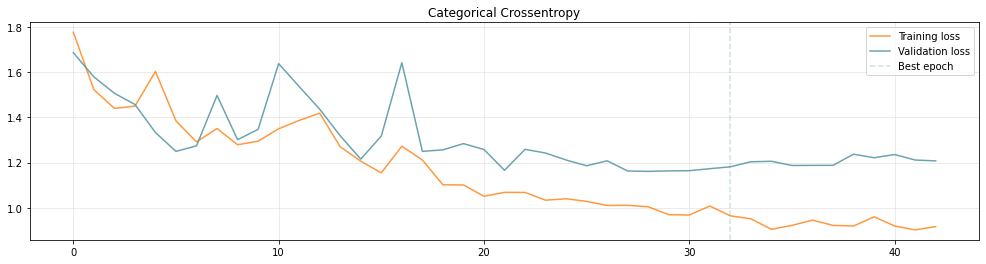

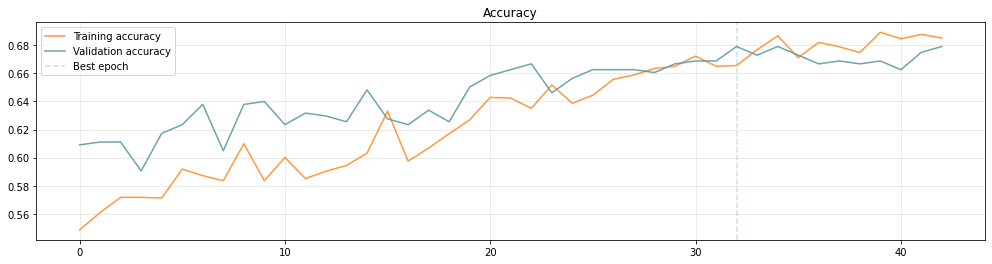

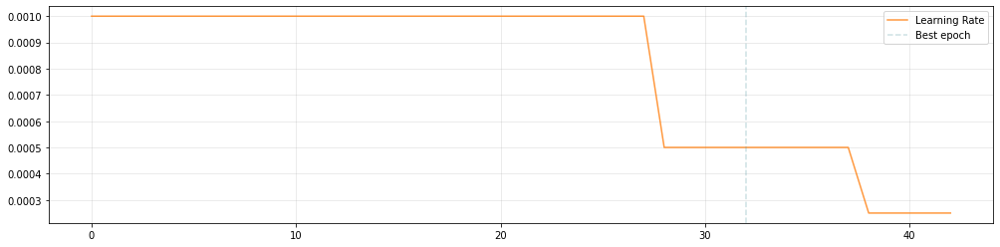

In [75]:
models = tuner.get_best_models(num_models=1)
best_model = models[0]

best_model.build()
TrainingTime(best_model)

With a quick tuning of the model we are able to obtain even better results on validation. 

To push even further this idea we can try to add some skipped connections, building a sort of ResNet but much simple. <br>
Then we will tune it to achieve the best result!

In [76]:
# Building a 1D CNN similar to the results obtained trought hyper parameter selection
# we avoid maxpooling layers since this model will be used as base line to compare with a model provided with skipped connections

def build_TheMachine():
    
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(input_layer)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    
    
    gap = tfkl.GlobalAveragePooling1D()(cnn)
    classifier = tfkl.Dropout(rate = 0.3)(gap)
   
    classifier = tfkl.Dense(96, activation='elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu')(classifier)
    classifier = tfkl.Dense(256, activation='elu')(classifier)
    classifier = tfkl.Dense(400, activation='elu')(classifier)
    classifier = tfkl.Dense(112, activation='elu')(classifier)
    
    classifier = tfkl.Dense(240, activation= 'elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(448, activation='elu')(classifier)
      
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')


    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [77]:
TheMachine = build_TheMachine()
TheMachine.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 36, 6)]           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 36, 128)           2432      
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 36, 128)           49280     
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 36, 128)           49280     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 36, 128)           49280     
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 36, 128)           49280     
_________________________________________________________________
global_average_pooling1d_1 ( (None, 128)               0     

Epoch 1/100
31/31 [==============================] - 1s 15ms/step - loss: 2.2638 - accuracy: 0.3114 - val_loss: 1.8885 - val_accuracy: 0.3765
Epoch 2/100
31/31 [==============================] - 0s 6ms/step - loss: 1.7044 - accuracy: 0.4380 - val_loss: 1.3639 - val_accuracy: 0.4959
Epoch 3/100
31/31 [==============================] - 0s 6ms/step - loss: 1.3976 - accuracy: 0.5121 - val_loss: 1.1928 - val_accuracy: 0.5658
Epoch 4/100
31/31 [==============================] - 0s 6ms/step - loss: 1.2598 - accuracy: 0.5728 - val_loss: 1.1420 - val_accuracy: 0.6214
Epoch 5/100
31/31 [==============================] - 0s 6ms/step - loss: 1.2364 - accuracy: 0.5723 - val_loss: 1.0873 - val_accuracy: 0.6296
Epoch 6/100
31/31 [==============================] - 0s 6ms/step - loss: 1.1375 - accuracy: 0.6130 - val_loss: 1.1974 - val_accuracy: 0.6255
Epoch 7/100
31/31 [==============================] - 0s 6ms/step - loss: 1.1054 - accuracy: 0.6233 - val_loss: 1.1705 - val_accuracy: 0.5988
Epoch 8/100


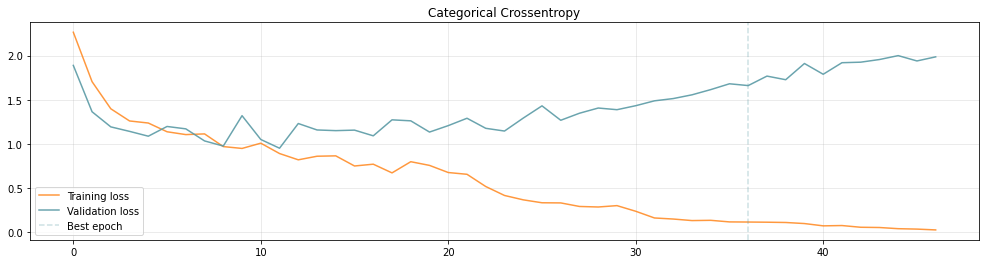

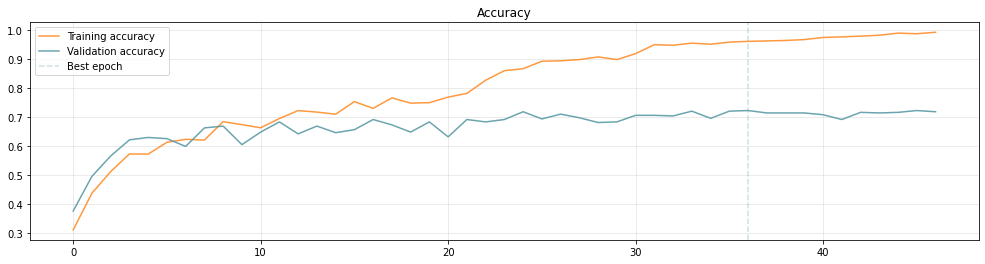

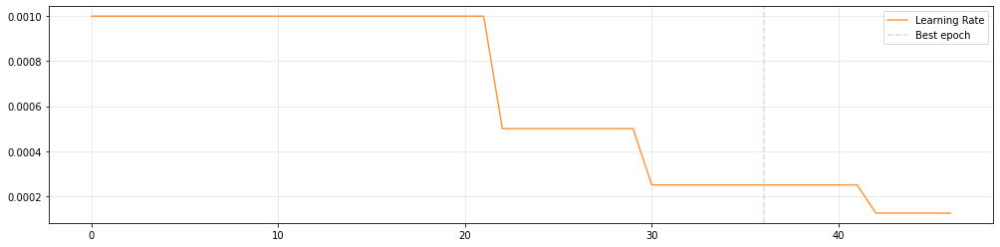

In [78]:
TrainingTime(TheMachine)

Now that we have a baseline we will try to get a better accuracy value using skipped connections

In [79]:
def build_TheMachine_v2():
    
    input_layer = tfkl.Input(shape=input_shape, name='Input')
    
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(input_layer)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    block_1_output = tfkl.Conv1D(128,3,padding='same',activation='elu')(input_layer)
    
    # addin a skipped connection connecting the output of the fisrt block with the second
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(block_1_output)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    block_2_output = layers.add([cnn, block_1_output])
    
    # adding a second skipped connection
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(block_2_output)
    block_3_output = layers.add([cnn, block_2_output])
        
    gap = tfkl.GlobalAveragePooling1D()(block_3_output)
    classifier = tfkl.Dropout(rate = 0.3)(gap)
   
    classifier = tfkl.Dense(96, activation='elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu')(classifier)
    classifier = tfkl.Dense(256, activation='elu')(classifier)
    classifier = tfkl.Dense(400, activation='elu')(classifier)
    classifier = tfkl.Dense(112, activation='elu')(classifier)
    
    classifier = tfkl.Dense(240, activation= 'elu')(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(448, activation='elu')(classifier)
    
      
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')


    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [80]:
TheMachine_v2 = build_TheMachine_v2()
TheMachine_v2.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(None, 36, 6)]      0                                            
__________________________________________________________________________________________________
conv1d_8 (Conv1D)               (None, 36, 128)      2432        Input[0][0]                      
__________________________________________________________________________________________________
conv1d_9 (Conv1D)               (None, 36, 128)      49280       conv1d_8[0][0]                   
__________________________________________________________________________________________________
conv1d_10 (Conv1D)              (None, 36, 128)      49280       conv1d_9[0][0]                   
______________________________________________________________________________________________

Epoch 1/100
31/31 [==============================] - 1s 13ms/step - loss: 3.6834 - accuracy: 0.2980 - val_loss: 1.8880 - val_accuracy: 0.3827
Epoch 2/100
31/31 [==============================] - 0s 6ms/step - loss: 2.1125 - accuracy: 0.3783 - val_loss: 1.6621 - val_accuracy: 0.4465
Epoch 3/100
31/31 [==============================] - 0s 6ms/step - loss: 1.9696 - accuracy: 0.4030 - val_loss: 1.5217 - val_accuracy: 0.4774
Epoch 4/100
31/31 [==============================] - 0s 5ms/step - loss: 1.6795 - accuracy: 0.4545 - val_loss: 1.4665 - val_accuracy: 0.4979
Epoch 5/100
31/31 [==============================] - 0s 6ms/step - loss: 1.6112 - accuracy: 0.4637 - val_loss: 1.3417 - val_accuracy: 0.5576
Epoch 6/100
31/31 [==============================] - 0s 6ms/step - loss: 1.5006 - accuracy: 0.5069 - val_loss: 1.3280 - val_accuracy: 0.5617
Epoch 7/100
31/31 [==============================] - 0s 6ms/step - loss: 1.4864 - accuracy: 0.5044 - val_loss: 1.2653 - val_accuracy: 0.5844
Epoch 8/100


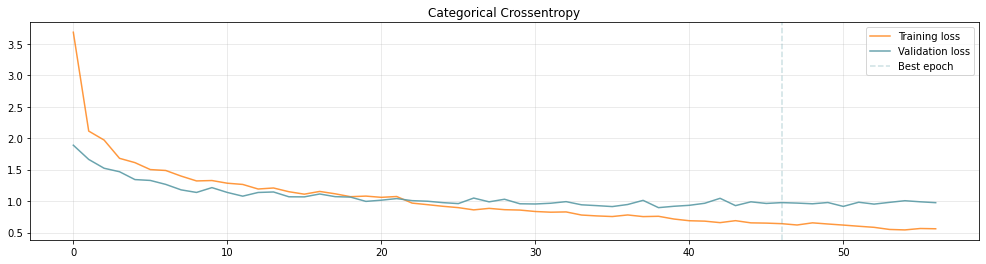

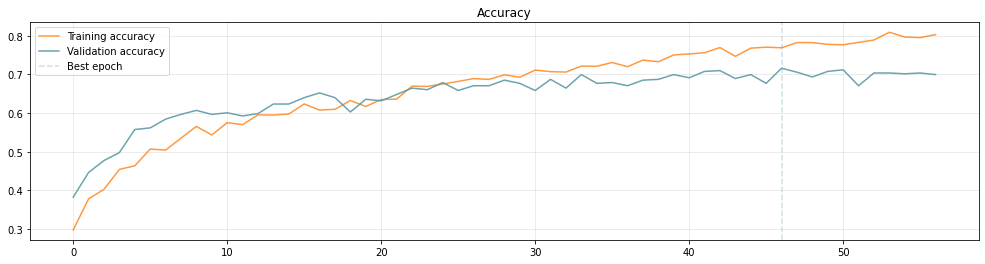

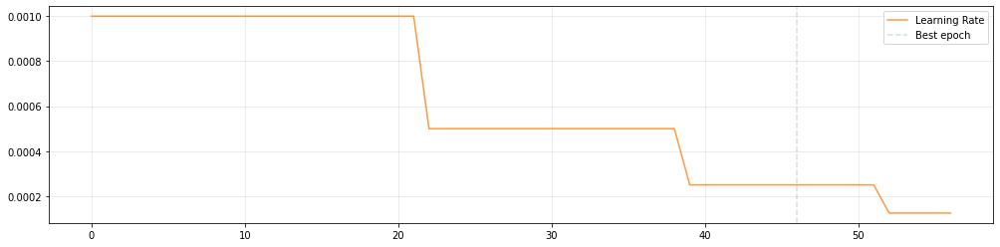

In [81]:
TrainingTime(TheMachine_v2)

TheMachine with a two Skipped Connection improved quite a little the accuracy score! Also the model reached a better result in much less time and with less accuracy on the training. Now we can start to regularise a little the model

In [82]:
def build_TheMachine_v2R(elastic_lambda = 1e-5): # R is for Regularised 
    
    input_layer = tfkl.Input(shape=input_shape, name='Input')
    
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(input_layer)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    block_1_output = tfkl.Conv1D(128,3,padding='same',activation='elu')(input_layer)
    
    # addin a skipped connection connecting the output of the fisrt block with the second
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(block_1_output)
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(cnn)
    block_2_output = layers.add([cnn, block_1_output])
    
    cnn = tfkl.Conv1D(128,3,padding='same',activation='elu')(block_2_output)
    block_3_output = layers.add([cnn, block_2_output])
        
    gap = tfkl.GlobalAveragePooling1D()(block_3_output)
    classifier = tfkl.Dropout(rate = 0.3)(gap)
   
    classifier = tfkl.Dense(96, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(240, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dense(256, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dense(400, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dense(112, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    
    classifier = tfkl.Dense(240, activation= 'elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    classifier = tfkl.Dropout(rate = 0.3)(classifier)
    
    classifier = tfkl.Dense(448, activation='elu', kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(classifier)
    
      
    output_layer = tfkl.Dense(classes, activation='softmax')(classifier)

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')


    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

Epoch 1/100
31/31 [==============================] - 2s 16ms/step - loss: 4.0919 - accuracy: 0.2990 - val_loss: 2.3429 - val_accuracy: 0.3642
Epoch 2/100
31/31 [==============================] - 0s 8ms/step - loss: 2.5126 - accuracy: 0.3649 - val_loss: 2.0699 - val_accuracy: 0.3951
Epoch 3/100
31/31 [==============================] - 0s 7ms/step - loss: 2.0787 - accuracy: 0.4261 - val_loss: 1.7656 - val_accuracy: 0.4938
Epoch 4/100
31/31 [==============================] - 0s 8ms/step - loss: 1.9696 - accuracy: 0.4452 - val_loss: 1.6713 - val_accuracy: 0.5041
Epoch 5/100
31/31 [==============================] - 0s 6ms/step - loss: 1.8414 - accuracy: 0.4792 - val_loss: 1.5956 - val_accuracy: 0.5638
Epoch 6/100
31/31 [==============================] - 0s 6ms/step - loss: 1.7087 - accuracy: 0.5100 - val_loss: 1.4640 - val_accuracy: 0.5761
Epoch 7/100
31/31 [==============================] - 0s 6ms/step - loss: 1.6467 - accuracy: 0.5234 - val_loss: 1.4118 - val_accuracy: 0.6091
Epoch 8/100


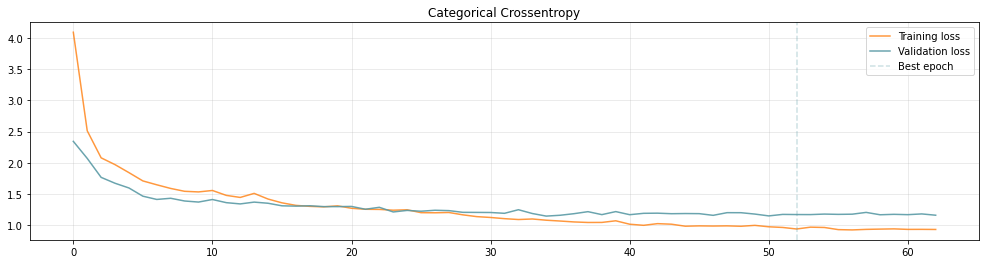

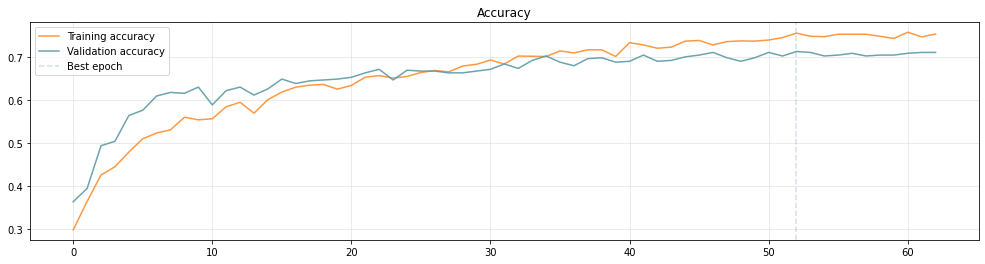

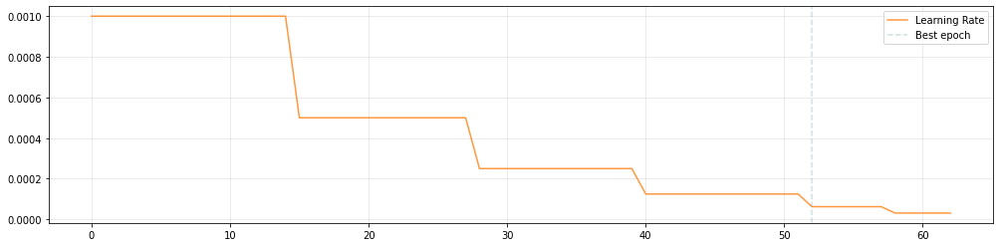

In [83]:
TheMachine_v2R = build_TheMachine_v2R()
TrainingTime(TheMachine_v2R)

Not really what I wanted or expected but the meaning of regularising using L1 or L2, or like this case an elastic net is to achive better generalisation capabilities paying up front a little of accuracy in the train and may be in the validation. So I am guessing that the model will not lose too much accuracy once tested on the hidden test. Meanwhile, previous models (not regularised enough) will probabily lose much more acuracy once tested on the hidden test set, so much that they could even pefrorm worst than the regularised model.

Thaking this reasonment into consideration now we relay once again to keras tuner to try to get the best possible outcome from this model.

In [84]:
def build_TheMachine_v4(hp, input_shape = (36, 6)): 
    
    input_layer = tfkl.Input(shape=input_shape, name='Input')

# --- first block ---
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(input_layer)
    
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    block_1_output = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    
    
# --- second block ----  
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(block_1_output)
    
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    block_2_output = layers.add([cnn, block_1_output])
    
    
    
# --- third block ---
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(block_2_output)
    
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    cnn = tfkl.Conv1D(filters = hp.Int('filters_1', min_value=16, max_value=512, step=16),
                                kernel_size = 3, 
                                padding = "same",
                                activation = hp.Choice("activation", ["relu",'elu']))(cnn)
    
    block_3_output = layers.add([cnn, block_2_output])  
    
# --- GAP --- 
    cnn = tfkl.GlobalAveragePooling1D()(block_3_output)
    
    
    
# --- X number of Dense layers with Optional DropOut and Forced L1L2 regularisation ---
    for i in range(hp.Int("num_layers", 1, 10)):
        cnn = tfkl.Dense(units= hp.Int(f"units{i}", min_value=16, max_value=512, step=16), 
                         activation= hp.Choice("activation", ["relu", 'elu']), 
                         kernel_regularizer=tf.keras.regularizers.L1L2(
                             l1 = hp.Float(f"rate{i}", min_value= 1e-5, max_value= 5e-3, step=2e-5), # first elastic lambda
                             l2 = hp.Float(f"rate{i}", min_value= 1e-5, max_value= 5e-3, step=2e-5)) # second elastic lambda
                        )(cnn) 
        
        if hp.Boolean(f"dropout{i}"): # adding a dropout layer if needed
            cnn = tfkl.Dropout(rate= hp.Float(f"rate{i}", min_value= 0.01, max_value= 0.3, step=0.05))(cnn)
            
    output_layer = tfkl.Dense(classes, activation='softmax')(cnn)

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')
    
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

In [85]:
TheMachine_v4 =  build_TheMachine_v4(keras_tuner.HyperParameters())

In [86]:
tuner = keras_tuner.RandomSearch(
    hypermodel=build_TheMachine_v4,
    objective="val_accuracy",
    max_trials= max_trials, #we used 20 trials to get a good model
    executions_per_trial=4,
    overwrite=True,
    directory="my_dir",
    project_name="TMv4_Search",
)

tuner.search_space_summary()

Search space summary
Default search space size: 6
filters_1 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 512, 'step': 16, 'sampling': None}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'elu'], 'ordered': False}
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 1, 'sampling': None}
units0 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 512, 'step': 16, 'sampling': None}
rate0 (Float)
{'default': 1e-05, 'conditions': [], 'min_value': 1e-05, 'max_value': 0.005, 'step': 2e-05, 'sampling': None}
dropout0 (Boolean)
{'default': False, 'conditions': []}


In [87]:
tuner.search(X_train, y_train, epochs = 5, validation_data = (X_validation, y_validation))

Trial 2 Complete [00h 00m 28s]
val_accuracy: 0.3894032835960388

Best val_accuracy So Far: 0.5375514328479767
Total elapsed time: 00h 00m 55s


Epoch 1/100
31/31 [==============================] - 2s 32ms/step - loss: 5.4011 - accuracy: 0.5965 - val_loss: 5.2069 - val_accuracy: 0.5741
Epoch 2/100
31/31 [==============================] - 1s 19ms/step - loss: 4.9294 - accuracy: 0.6119 - val_loss: 4.7317 - val_accuracy: 0.6070
Epoch 3/100
31/31 [==============================] - 1s 20ms/step - loss: 4.5706 - accuracy: 0.6166 - val_loss: 4.4100 - val_accuracy: 0.6008
Epoch 4/100
31/31 [==============================] - 1s 19ms/step - loss: 4.2023 - accuracy: 0.6438 - val_loss: 4.1356 - val_accuracy: 0.5967
Epoch 5/100
31/31 [==============================] - 1s 24ms/step - loss: 3.8820 - accuracy: 0.6500 - val_loss: 3.8590 - val_accuracy: 0.6296
Epoch 6/100
31/31 [==============================] - 1s 22ms/step - loss: 3.6321 - accuracy: 0.6711 - val_loss: 3.6236 - val_accuracy: 0.6481
Epoch 7/100
31/31 [==============================] - 1s 20ms/step - loss: 3.3208 - accuracy: 0.6974 - val_loss: 3.4075 - val_accuracy: 0.6358
Epoch 

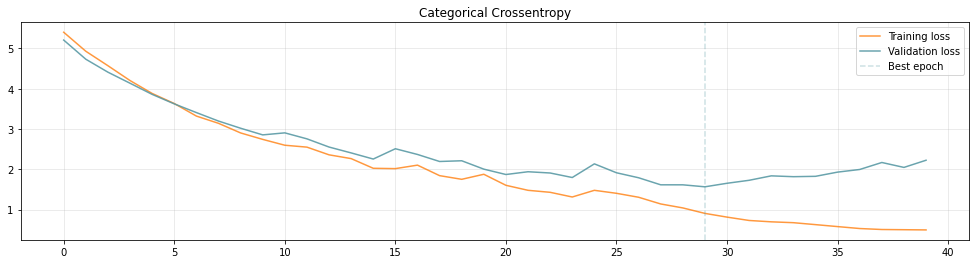

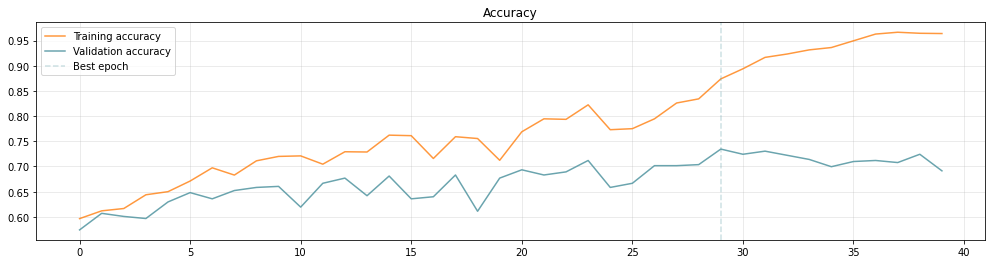

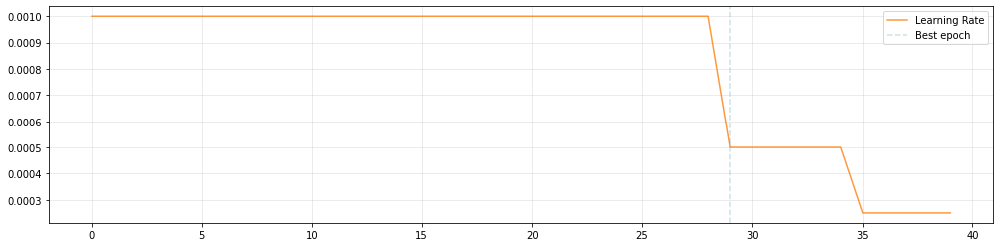

In [88]:
models = tuner.get_best_models(num_models=1)
TMv4 = models[0]

TMv4.build(input_shape)
TrainingTime(TMv4)

Epoch 1/100
31/31 [==============================] - 1s 20ms/step - loss: 0.7770 - accuracy: 0.9038 - val_loss: 1.5966 - val_accuracy: 0.7325
Epoch 2/100
31/31 [==============================] - 1s 20ms/step - loss: 0.7286 - accuracy: 0.9187 - val_loss: 1.6476 - val_accuracy: 0.7346
Epoch 3/100
31/31 [==============================] - 1s 19ms/step - loss: 0.7014 - accuracy: 0.9279 - val_loss: 1.6594 - val_accuracy: 0.7346
Epoch 4/100
31/31 [==============================] - 1s 19ms/step - loss: 0.6863 - accuracy: 0.9305 - val_loss: 1.6919 - val_accuracy: 0.7263
Epoch 5/100
31/31 [==============================] - 1s 19ms/step - loss: 0.6643 - accuracy: 0.9362 - val_loss: 1.7278 - val_accuracy: 0.7284
Epoch 6/100
31/31 [==============================] - 1s 20ms/step - loss: 0.6479 - accuracy: 0.9413 - val_loss: 1.7816 - val_accuracy: 0.7263
Epoch 7/100
31/31 [==============================] - 1s 19ms/step - loss: 0.6316 - accuracy: 0.9449 - val_loss: 1.7820 - val_accuracy: 0.7263
Epoch 

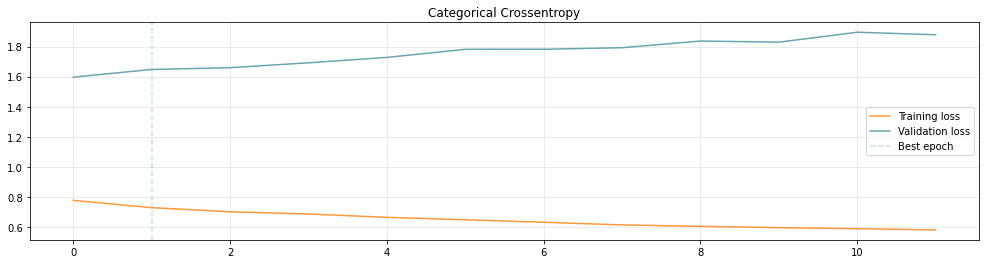

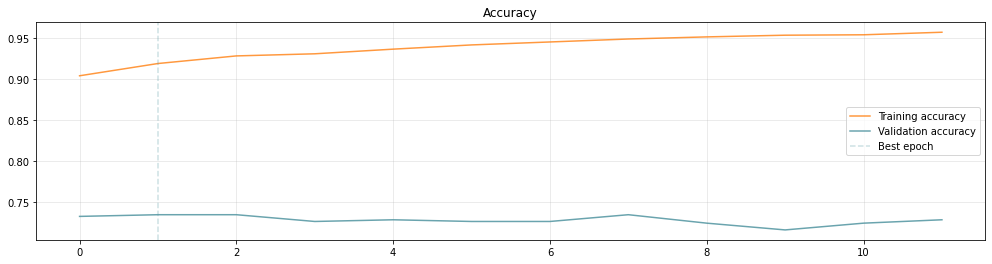

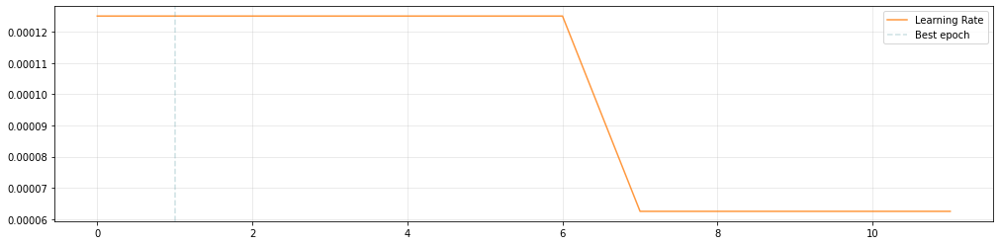

In [89]:
TrainingTime(TMv4)

We also performed a much more robust search suing 200 max trials and 400 max trials but the best fully tunable model was obtained (with a bit of luck) using 20 max trials and 5 epochs for each. Also we tried to train our model for 10000 epochs but in the end the model yelded no major improvement. (it was a waste of time) 

![![Screenshot 2022-12-18 at 18.51.52.png](attachment:f2b5137a-e75f-40a9-aa37-345ca99fc224.png)
](http://)

### Let's get Creative 

#### Reccurence plots 

In [90]:
# denunciato come furto in questura (stack-overflow)
import sklearn as sk

def recurrence_plot(s, eps=None, steps=None):
    if eps==None: eps=0.1
    if steps==None: steps=10
    d = sk.metrics.pairwise.pairwise_distances(s)
    d = np.floor(d / eps)
    d[d > steps] = steps
    #Z = squareform(d)
    return d

In [91]:
# An example of Reccurente plots using only 1 features! 
def RecurrencePlotExample(features = 5):
    fig = plt.figure(figsize=(15,14))

    ax = fig.add_subplot(2, 3, 1)
    ax.imshow(recurrence_plot(df_train.loc[ 0 : 35 , 1 : features].to_numpy().reshape(-1, 1)))
    ax.set_xlabel('Money')

    ax = fig.add_subplot(2, 3, 2)
    ax.imshow(recurrence_plot(df_train.loc[ 0 + 36 : 35 + 36 , 1 : features].to_numpy().reshape(-1, 1)))
    ax.set_xlabel('Sorrow')

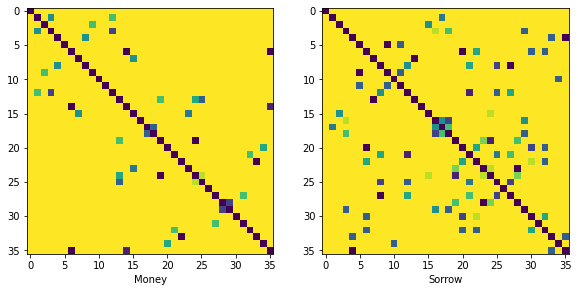

In [92]:
RecurrencePlotExample(features = 1)

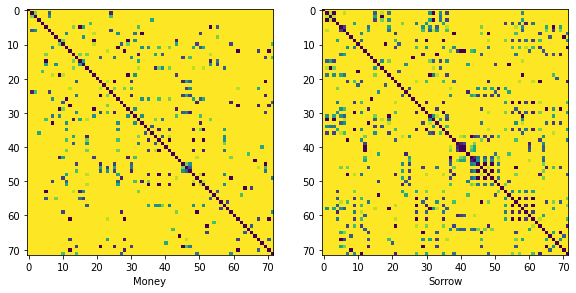

In [93]:
RecurrencePlotExample(features = 2)

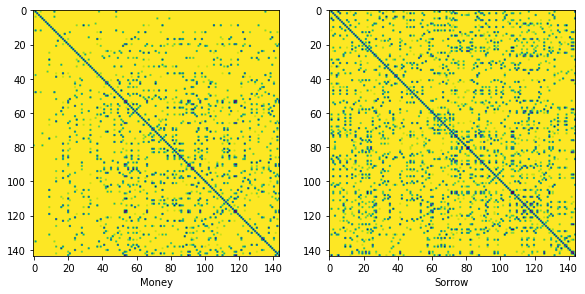

In [94]:
RecurrencePlotExample(features = 4)

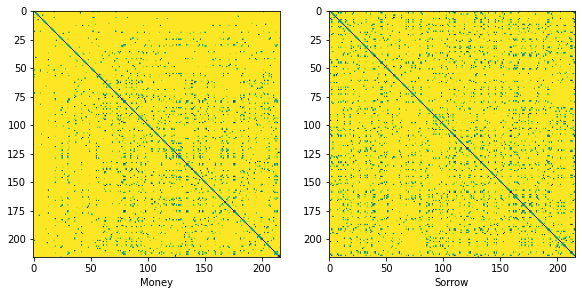

In [95]:
RecurrencePlotExample(features = 6)

Now we can try to classify them! 

In [96]:
import time
from skimage.transform import resize

def GetRecurrencePlots(num_features = 1, df = data):
    #pre allocate arrays (this is very dumb coding, but is also very fast)
    num_samples = 2429
    time_points = 36
    num_features = 1

    #x_train = np.zeros((num_samples, time_points, num_features))
    x_train = list()
    y_train = np.zeros(num_samples)
    c = 0

    start = time.time() 
    for j in range(0, num_samples):
        shift = time_points * j
        dat = recurrence_plot(df.loc[ 0 + shift : 35 + shift , 1 : num_features].to_numpy())
       # print(dat.shape) debugging 1
       # dat = resize(dat, (time_points, num_features),mode='constant') avoiding resizing
       # print(dat) debugging 2
       # x_train[c,:,:] = dat
        x_train.append(dat)
        y_train[c] = df[df['Sample_Number'] == j].loc[0 + shift , 'Song']
        c = c + 1

    x_train = np.array(x_train)

    end = time.time()
    print('Elapsed time:')
    print(end - start)
    return x_train

In [97]:
# define the paths 
x_train_path =  DATASET_PATH + '/x_train.npy'
y_train_path = DATASET_PATH + '/y_train.npy'

# loading the classes data
y_train = np.load(y_train_path)
x_train = np.load(x_train_path)

data = MultiDimensionalPanda(x_train)
data = AdditionalInformations(data, y_train)

x_train = GetRecurrencePlots(num_features = 1, df = data)

Elapsed time:
2.576237440109253


In [98]:
#reshape to include depth
X_train = x_train.reshape(x_train.shape[0], 1, 36, 36)

#convert to float32 and normalize to [0,1]
X_train = X_train.astype('float32')
X_train /= np.amax(X_train)

# convert labels to class matrix, one-hot-encoding
Y_train = keras.utils.np_utils.to_categorical(y_train, 12)

# split in train and test set
X_train, x_test, Y_train, y_test = train_test_split(X_train, Y_train, test_size=0.1, stratify=y_train)

In [99]:
input_shape = X_train.shape[1:]

def build_model(input_shape):
    tf.random.set_seed(seed)

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    conv1 = tfkl.Conv2D(
        filters=32,
        kernel_size=(3, 3),
        strides = (1, 1),
        padding = 'same',
        activation = 'relu',
        kernel_initializer = tfk.initializers.HeUniform(seed)
    )(input_layer)
    
    conv2 = tfkl.Conv2D(
        filters=64,
        #higher filter numbers 
        kernel_size=(3, 3),
        strides = (1, 1),
        padding = 'same',
        activation = 'relu',
        kernel_initializer = tfk.initializers.HeUniform(seed)
    )(conv1)

    conv3 = tfkl.Conv2D(
        filters=128,
        #MORE FILTERS…
        kernel_size=(3, 3),
        strides = (1, 1),
        padding = 'same',
        activation = 'relu',
        kernel_initializer = tfk.initializers.HeUniform(seed)
    )(conv2)

    flattening_layer = tfkl.Flatten(name='Flatten')(conv3)
    #Flattening: I am sqeusing my dimension in a one dimensional vector. 
    #So I am putting it in a format that can be understood by the model.

    classifier_layer = tfkl.Dense(
        units=128, 
        name='Classifier', 
        activation='relu',
        kernel_initializer = tfk.initializers.HeUniform(seed)
    )(flattening_layer)
    classifier_layer = tfkl.Dropout(0.5, seed=seed)(classifier_layer)
    output_layer = tfkl.Dense(
        units=12, 
        activation='softmax', 
        #sfot max is really good. '' is like a weighted sum of sigmoids operations'' (never to be spoken again)
        kernel_initializer = tfk.initializers.GlorotUniform(seed),
        name='Output'
    )(classifier_layer)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')
    #categorical crossentropy is a loss function related to entropy with multiplie image to classify

    # Return the model
    return model

In [100]:
model = build_model(input_shape)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 1, 36, 36)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 1, 36, 32)         10400     
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1, 36, 64)         18496     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 36, 128)        73856     
_________________________________________________________________
Flatten (Flatten)            (None, 4608)              0         
_________________________________________________________________
Classifier (Dense)           (None, 128)               589952    
_________________________________________________________________
dropout (Dropout)            (None, 128)               0     

In [101]:
history = model.fit(
    x = X_train,
    y = Y_train,
    batch_size = batch_size,
    epochs = epochs,
    validation_data= (x_test, y_test),
    callbacks = [
        tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True),
        tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=20, factor=0.5, _lr=1e-5)]
).history

Epoch 1/100
35/35 [==============================] - 1s 10ms/step - loss: 2.2101 - accuracy: 0.2823 - val_loss: 2.0647 - val_accuracy: 0.3210
Epoch 2/100
35/35 [==============================] - 0s 5ms/step - loss: 2.0958 - accuracy: 0.3147 - val_loss: 2.0272 - val_accuracy: 0.3210
Epoch 3/100
35/35 [==============================] - 0s 4ms/step - loss: 2.0807 - accuracy: 0.3134 - val_loss: 2.0169 - val_accuracy: 0.3210
Epoch 4/100
35/35 [==============================] - 0s 4ms/step - loss: 2.0340 - accuracy: 0.3193 - val_loss: 2.0058 - val_accuracy: 0.3210
Epoch 5/100
35/35 [==============================] - 0s 4ms/step - loss: 2.0173 - accuracy: 0.3216 - val_loss: 1.9919 - val_accuracy: 0.3210
Epoch 6/100
35/35 [==============================] - 0s 4ms/step - loss: 1.9735 - accuracy: 0.3188 - val_loss: 1.9688 - val_accuracy: 0.3333
Epoch 7/100
35/35 [==============================] - 0s 4ms/step - loss: 1.9331 - accuracy: 0.3312 - val_loss: 1.9580 - val_accuracy: 0.3210
Epoch 8/100


Once again the results are lacklsuter! But the idea to us seemed quite interesting so we were quite happy to give it a try. 
One of its problem could be the model used to classify the images. Once again with more time we could have explored better also this possibility. 